The idea here is to perform the dynamic vs. static comparison
- X-timepoint
- mc - hmc - mc+hmc
- Difference here is that we want to use all dynamic regions (~38,000)---and then downsample static to # match

# Get BEDs prepared for input

In [2]:
dir_beds=/data/hodges_lab/Tim/biomodal/data/tcseq/

## Dynamic: 

In [3]:
cd ${dir_beds}

# Combine
# Dynamic only
cat peak_subset_cluster_1.bed \
peak_subset_cluster_2.bed \
peak_subset_cluster_3.bed \
peak_subset_cluster_4.bed \
peak_subset_cluster_5.bed \
peak_subset_cluster_6.bed \
peak_subset_cluster_7.bed | \
bedtools sort -i - > peak_subset_cluster_all_dynamic.txt

# Dynamic only - merged - unused
bedtools merge -i peak_subset_cluster_all_dynamic.txt > peak_subset_cluster_all_dynamic.merged.txt

In [4]:
wc -l peak_subset_cluster_all_dynamic*

  38167 peak_subset_cluster_all_dynamic.merged.txt
  38167 peak_subset_cluster_all_dynamic.txt
  76334 total


In [8]:
cp peak_subset_cluster_all_dynamic.txt peak_subset_dynamic_38167.txt

## Static (downsample to 38,167)

In [9]:
shuf -n 38167 peak_subset_static.bed > peak_subset_static_38167.txt

# Libraries

In [ ]:
# python kernel

In [3]:
#  /data/hodges_lab/Tim/.conda/envs/jupyter_modality/lib/python3.11/site-packages
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import pyranges as pr
import seaborn as sns
import statsmodels.api as sm
import xgboost as xgb
import xarray as xr
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import mean_squared_error, r2_score
from scipy.stats import pearsonr, spearmanr
import pysam
import os
os.environ["DS_BUCKET_CACHE"]="/data/hodges_lab/Tim/biomodal/tmp/"
import math
import matplotlib as mpl


import modality
from modality.contig_dataset import ContigDataset
from modality.annotation import get_tss_region

import warnings
warnings.filterwarnings(action="ignore", category=RuntimeWarning)
warnings.simplefilter(action='ignore', category=FutureWarning)

biomodal_palette = ["#003B49", "#9CDBD9", "#F87C56", "#C0DF16", "#05868E"]

print("Loaded.")

Loaded.


# Load 6-base duet evoC data

In [4]:
## Load 6-base duet evoC data
sixbase_path = "/data/hodges_lab/Tim/biomodal/data/Hodges_2024_02_CG.zarrz"
ds = ContigDataset.from_zarrz(sixbase_path)

# Load region file

In [5]:
dir_regions="/data/hodges_lab/Tim/biomodal/data/tcseq/"

## Shuffled regions

In [6]:
# set groups to iterate through 
# note: the files were set up to have a common name, except for groupnames to iterate
sets=['dynamic','static']

In [6]:
# create a dictionary to keep track of input BED files
beds={}

# load in BED files to the dictionary
for i in sets:
    beds[i]=pr.readers.read_bed(dir_regions + "peak_subset_"+str(i)+"_38167.txt")

In [7]:
beds

{'dynamic': +------------------+-----------+-----------+
 | Chromosome       | Start     | End       |
 | (category)       | (int64)   | (int64)   |
 |------------------+-----------+-----------|
 | chr1             | 845758    | 845944    |
 | chr1             | 966281    | 966562    |
 | chr1             | 970505    | 970750    |
 | chr1             | 996923    | 997522    |
 | ...              | ...       | ...       |
 | chrUn_GL000224v1 | 3671      | 4021      |
 | chrUn_KI270422v1 | 837       | 1187      |
 | chrUn_KI270544v1 | 925       | 1126      |
 | chrUn_KI270752v1 | 20582     | 20719     |
 +------------------+-----------+-----------+
 Unstranded PyRanges object has 38,167 rows and 3 columns from 46 chromosomes.
 For printing, the PyRanges was sorted on Chromosome.,
 'static': +------------------+-----------+-----------+
 | Chromosome       | Start     | End       |
 | (category)       | (int64)   | (int64)   |
 |------------------+-----------+-----------|
 | chr1          

# Center bed files

## Function def

In [8]:
## center_bed_coord
## Purpose: Take in a pyranges bed file and centers the start and end coordinates
##          to represent one base pair
## Takes: PyRanges object
## Returns: PyRanges object
## E.g.: chr1  100  200  -->  chr1  150 151
def center_bed_coord(input_bed, offset):
    # make copy of input PyRanges as df
    input_bed_df=input_bed.df
    # find start
    input_bed_df['Start']=np.floor((input_bed.df['Start']+input_bed.df['End']) / 2).astype(int)-offset
    # find end
    input_bed_df['End'] = (np.floor((input_bed.df['Start']+input_bed.df['End']) / 2)).astype(int)+offset
    # convert to PyRanges object
    input_bed_pr=pr.PyRanges(input_bed_df)
    # return PyRanges object
    return(input_bed_pr)

## center

In [9]:
# create empty dictionary to keep track of centered BEDs
beds250={}
offset_val=250

# center
for i in sets:
    beds250[i]=center_bed_coord(beds[i], offset_val)

# Map ATAC_6base data

## Function def

In [10]:
## Written by Biomodal
def get_atac_6base_over_tss(time, ds, tss_pr):

    # select sample for the timepoint
    if time == 0:
        sample = "10274-AJ-0289"
        atac_time = "0hr"
    elif time == 4:
        sample = "10274-AJ-0290"
        atac_time = "108hr"
    elif time == 8:
        sample = "10274-AJ-0291"
        atac_time = "12day"

    print("Getting 6-base data for sample: " + sample)
    ds = ds.select_samples([sample])
    
    ds = ds.assign_fractions(
        numerators=["num_modc", "num_mc", "num_hmc"],
        denominator="num_total_c", 
        min_coverage=10
    )

    # load ATAC_seq data
    atac_path = "/data/hodges_lab/Tim/biomodal/data/bedgraphs/NPCdiffATACme" + atac_time + "_merge_filtered.bedGraph"
    print("Loading ATAC-seq data from: " + atac_path)
    atac = pd.read_csv(atac_path, sep = "\t",
                       names=['Chromosome', 'Start', 'End', 'Accessibility'])
    
    contigs = ["chr" + str(x) for x in list(range(1,23)) + ["X", "Y"]]
    atac = atac[atac.Chromosome.isin(contigs)]
    atac.Chromosome = pd.Categorical(atac.Chromosome)
    atac.Start = atac.Start.astype(int)
    atac.End = atac.End.astype(int)
    atac.Accessibility = atac.Accessibility.astype(float)
    atac['End'] = atac['End'] - 1
    # make as pyranges
    atac_pr = pr.PyRanges(atac)

    print("Overlapping ATAC-seq data with TSS regions.")
    # find atac-regions that overlap tss
    accessib = atac_pr.intersect(tss_pr)
    # assign id to the overlapping regions
    # if less than 1 bp apart, assign the same id
    r = accessib.cluster(slack=1)
    # add length of regions
    r.Length = r.lengths()
    # group by clusters
    g = r.df.groupby('Cluster')

    # start and end coordinates for each cluster is now a TSS
    # for each region, get the mean accessibility, weighted by the length of the region
    result = pr.from_dict(
            {
                "Chromosome": g.Chromosome.first(),
                "Start": g.Start.min(),
                "End": g.End.max(),
                "accessibility": g.apply(collapse, 'Accessibility'),
            }
        )
    
    # join with tss data
    joined_list = result.join(tss_pr)
    atac_over_tss = joined_list
    atac_over_tss = atac_over_tss.drop_duplicate_positions().sort().copy()
    
    # update Range ID
    atac_over_tss.Ranges_ID = list(range(len(atac_over_tss)))
    
    # summarise 6-base data for all TSS regions
    print("Summarising 6-base data over TSS regions.")
    sixbase_over_tss = []
    
    for mod in ["mc", "hmc", "modc"]:
        print(mod)
    
        for offset_val in (-1000, -500, 0, 500, 1000):
            
            qq = atac_over_tss.apply(offset, offset=offset_val).unstrand()
                    
            y = ds.reduce_byranges(
                ranges=qq[["Chromosome", "Start", "End", "Ranges_ID"]],
                var=[f'frac_{mod}', f'num_{mod}'],
                min_count=1,
                # min_count is the minimum number of data entries required in each interval of range to calculate mean
                # we could adjust this to 3 or so
            )
    
            # also add num_contexts and range_length as data_vars
            y = y.reset_coords(['num_contexts', 'range_length'])
            
            mapper = {c: f"{c}_{offset_val}" for c in y.data_vars}
            y = y.rename_vars(mapper)
            
            sixbase_over_tss.append(y)
            
            #print(offset_val, mod)
            
    # create data frame with summarised 6-base data over TSS
    sixbase_over_tss_results = xr.merge(sixbase_over_tss, compat = 'override')
    sixbase_over_tss_df = sixbase_over_tss_results.to_dataframe().droplevel(1)
    sixbase_over_tss_df = sixbase_over_tss_df.drop(["contig", "start", "end"], axis=1)

    # add atac data to df
    result_df = atac_over_tss.df.copy()
    result_df = result_df.set_index("Ranges_ID")
    result_df = result_df.join(sixbase_over_tss_df)
    # not including TSS with accessibility = 0 at this stage
    # TODO: identify "true" regions with 0 accessibility using coverage from WGS data?
    result_df['log_accessibility'] = [np.log(x) if x > 0 else np.nan for x in result_df.accessibility.values]
    return(result_df)
    

# for each region, get the mean accessibility, weighted by the length of the region
def collapse(df, val):
    x = np.average(df[val], weights = df.Length)
    return x


def offset(df, **kwargs):
    df_copy = df.copy()
    df_copy.loc[:, "End"] = kwargs["offset"] + df_copy.End
    df_copy.loc[:, "Start"] = kwargs["offset"] + df_copy.Start
    return df_copy

## map

In [11]:
beds250_m0={}
beds250_m4={}
beds250_m8={}

for i in sets:
    print('-------------     Mapping: '+i+'     -------------')
    beds250_m0[i]=get_atac_6base_over_tss(time = 0,
                                          ds = ds,
                                          tss_pr = beds250[i])
    beds250_m4[i]=get_atac_6base_over_tss(time = 4,
                                          ds = ds,
                                          tss_pr = beds250[i])
    beds250_m8[i]=get_atac_6base_over_tss(time = 8,
                                          ds = ds,
                                          tss_pr = beds250[i])

-------------     Mapping: dynamic     -------------
Getting 6-base data for sample: 10274-AJ-0289
Loading ATAC-seq data from: /data/hodges_lab/Tim/biomodal/data/bedgraphs/NPCdiffATACme0hr_merge_filtered.bedGraph
Overlapping ATAC-seq data with TSS regions.
Summarising 6-base data over TSS regions.
mc
hmc
modc
Getting 6-base data for sample: 10274-AJ-0290
Loading ATAC-seq data from: /data/hodges_lab/Tim/biomodal/data/bedgraphs/NPCdiffATACme108hr_merge_filtered.bedGraph
Overlapping ATAC-seq data with TSS regions.
Summarising 6-base data over TSS regions.
mc
hmc
modc
Getting 6-base data for sample: 10274-AJ-0291
Loading ATAC-seq data from: /data/hodges_lab/Tim/biomodal/data/bedgraphs/NPCdiffATACme12day_merge_filtered.bedGraph
Overlapping ATAC-seq data with TSS regions.
Summarising 6-base data over TSS regions.
mc
hmc
modc
-------------     Mapping: static     -------------
Getting 6-base data for sample: 10274-AJ-0289
Loading ATAC-seq data from: /data/hodges_lab/Tim/biomodal/data/bedgraph

## save mapped dictionaries

In [12]:
# Mapped on 0
np.save('/data/hodges_lab/Tim/biomodal/mapped_python_objects/static_vs_dynamic.mchmc_mc_hmc.x_timepoint.beds250_m0.npy', beds250_m0) 

# Mapped on 4 day
np.save('/data/hodges_lab/Tim/biomodal/mapped_python_objects/static_vs_dynamic.mchmc_mc_hmc.x_timepoint.beds250_m4.npy', beds250_m4) 

# Mapped on 8 day
np.save('/data/hodges_lab/Tim/biomodal/mapped_python_objects/static_vs_dynamic.mchmc_mc_hmc.x_timepoint.beds250_m8.npy', beds250_m8) 

In [ ]:
read_dictionary = np.load('my_file.npy',allow_pickle='TRUE').item()

In [7]:
# To load from this step
beds250_m0 = np.load('/data/hodges_lab/Tim/biomodal/mapped_python_objects/static_vs_dynamic.mchmc_mc_hmc.x_timepoint.beds250_m0.npy',allow_pickle='TRUE').item()

beds250_m4 = np.load('/data/hodges_lab/Tim/biomodal/mapped_python_objects/static_vs_dynamic.mchmc_mc_hmc.x_timepoint.beds250_m4.npy',allow_pickle='TRUE').item()

beds250_m8 = np.load('/data/hodges_lab/Tim/biomodal/mapped_python_objects/static_vs_dynamic.mchmc_mc_hmc.x_timepoint.beds250_m8.npy',allow_pickle='TRUE').item()

# Train/Predict

## Helper function def

In [8]:
## Written by Biomodal

def eval_results(test_obs, pred_obs):
    
    mse = mean_squared_error(test_obs, pred_obs)
    r2 = r2_score(test_obs, pred_obs)
    spear = spearmanr(test_obs, pred_obs).correlation
    pears = pearsonr(test_obs, pred_obs).statistic

    return {"mse": mse, "r2": r2, "pearsonR": pears, "spearmanR": spear}




def find_optimal_parameters(res_train, mod="mc + hmc", test_contig="chr8"):

    X = res_train.loc[res_train.accessibility > 0]
    X_train = X[X.Chromosome != test_contig]
    y_train = X_train['log_accessibility']

    # select predictors to use in model
    if (mod == "modc") | (mod == "mc"):
        predictors = ["frac_" + mod + "_mean_" + str(x) for x in [-1000,-500,0,500,1000]]
        predictors += ["num_contexts_" + str(x) for x in [-1000,-500,0,500,1000]]
    elif mod == "mc + hmc":
        predictors = ["frac_mc" + "_mean_" + str(x) for x in [-1000,-500,0,500,1000]]
        predictors += ["frac_hmc" + "_mean_" + str(x) for x in [-1000,-500,0,500,1000]]
        predictors += ["num_contexts_" + str(x) for x in [-1000,-500,0,500,1000]]
    
#     param_grid = {
#         "n_estimators": [500],
#         "max_depth": [7],
#         "eta": [0.01],
#         "subsample": np.arange(0.5, 0.6, 0.1),
#         "colsample_bytree": [0.8],
#     }
    
    param_grid = {
        "n_estimators": np.arange(100, 600, 200),
        "max_depth": np.arange(3, 8, 2),
        "eta": np.arange(0.01, 0.05, 0.01),
        "subsample": np.arange(0.2, 0.6, 0.1),
        "colsample_bytree": np.arange(0.8, 1.0, 0.05),
    }
    
    #{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 7, 'n_estimators': 500, 'subsample': 0.5000000000000001}
    
    print("Finding optimal parameters for: " + mod)
    regressor = xgb.XGBRegressor(eval_metric="rmsle")
    search = GridSearchCV(regressor, param_grid, cv=3).fit(X_train[predictors], y_train)
    print("Optimal parameters for " + mod + ":")
    print(search.best_params_)

## Function def: with scatterplots

In [9]:
## Written by Biomodal
## Editted by Tim Scott

def predict_accessibility_from_timepoint_scatter(
    res_train, res_test, t1, t2, 
    set_name="group_please_replace",
    scatter_out_dir="/data/hodges_lab/Tim/biomodal/scatterplots_static_dynamic_optimized/", 
    test_contig = "chr1", 
    main_title ="", 
    graphs=False, **kwargs
): # save_pdf = False, filename = None

    # Set training and testing data - one chromosome as outgroup
    X_train = res_train.loc[res_train.accessibility > 0]
    X_test = res_test.loc[res_test.accessibility > 0]
    X_train = X_train[X_train.Chromosome != test_contig]
    X_test = X_test[X_test.Chromosome == test_contig]
    y_train = X_train['log_accessibility']
    y_test = X_test['log_accessibility']
    
    
    # Initialize lists array for print reporting
    mse=["Mean Sq Err:"]
    rsquared=["R-squared:"]
    pearson=["Pearson's r:"]
    spearman=["Spearman's r:"]
    regressors={}
    fig, axes = plt.subplots(1, 4, figsize=(18, 5))
    
    for mod, ax in zip(["modc", "mc", "mc + hmc", "hmc"], axes.ravel()):
        # Initialize keys for dictionary if not existing
        if "mc_"+str(t1)+str(t2) not in spears:
            spears["mc_"+str(t1)+str(t2)]=[]
        if "mchmc_"+str(t1)+str(t2) not in spears:
            spears["mchmc_"+str(t1)+str(t2)]=[]
        if "hmc_"+str(t1)+str(t2) not in spears:
            spears["hmc_"+str(t1)+str(t2)]=[]
            
        
        # Select predictors to use in model - store in list
        if (mod == "modc") | (mod == "mc") | (mod=="hmc"):
            predictors = ["frac_" + mod + "_mean_" + str(x) for x in [-1000,-500,0,500,1000]]
            predictors += ["num_contexts_" + str(x) for x in [-1000,-500,0,500,1000]]
        elif mod == "mc + hmc":
            predictors = ["frac_mc" + "_mean_" + str(x) for x in [-1000,-500,0,500,1000]]
            predictors += ["frac_hmc" + "_mean_" + str(x) for x in [-1000,-500,0,500,1000]]
            predictors += ["num_contexts_" + str(x) for x in [-1000,-500,0,500,1000]]
        #print(predictors)
        
        
        # Fit the model to the training data using predictors
        # parameters optimal for day 8 mc+hmc model
        regressor_sixbase = xgb.XGBRegressor(
            n_estimators=kwargs.get('n_estimators', 500), # 500
            max_depth=kwargs.get('max_depth', 7), # 7
            eta=kwargs.get('eta', 0.02), # 0.01
            subsample=kwargs.get('subsample', 0.5), # 0.5
            colsample_bytree=kwargs.get('colsample_bytree', 0.95), # 0.8
        )
        # Fit
        regressor_sixbase.fit(X_train[predictors], y_train)
        
        
        # Predict
        y_pred_sixbase = regressor_sixbase.predict(X_test[predictors])
        
        
        # Eval results
        out = eval_results(y_test, y_pred_sixbase)
        mse.append(str(round(out['mse'],4)))
        rsquared.append(str(round(out['r2'],4)))
        pearson.append(str(round(out['pearsonR'],4)))
        spearman.append(str(round(out['spearmanR'],4)))
        # Record spearman in spearman_dictionary object
        if(mod=="mc"):
            spears["mc_"+str(t1)+str(t2)].append(str(round(out['spearmanR'],4)))
        if(mod=="mc + hmc"):
            spears["mchmc_"+str(t1)+str(t2)].append(str(round(out['spearmanR'],4)))
        if(mod=="hmc"):
            spears["hmc_"+str(t1)+str(t2)].append(str(round(out['spearmanR'],4)))
        regressors[mod]=regressor_sixbase
    
        # Plot results
        if graphs:
            r2=out['r2']
            spear_r=out['spearmanR']  
            sns.scatterplot(x=y_pred_sixbase, y=y_test, color=biomodal_palette[0], s=50, ax=ax)
            sns.regplot(x=[min(y_pred_sixbase), max(y_pred_sixbase)], 
                        y=[min(y_pred_sixbase), max(y_pred_sixbase)],
                        ci=None,
                        line_kws={"color": biomodal_palette[2], "linestyle": '--'},
                        ax=ax)
            if(mod == "modc"):
                ax.set_ylabel("Observed log(Accessibility)", size=16)
            else:
                ax.set_ylabel("", size=16)
            ax.set_xlabel("Predicted log(Accessibility)", size=16)
            if mod == "mc + hmc":
                mod = "mC + hmC"
            else:
                mod = mod[:-1] + mod[-1].upper()           
            ax.set_title(f"{mod}: $R^2$={r2:.3f}, Spearman $r$={spear_r:.3f}", size=18)
            ax.tick_params(axis='both', which='major', labelsize=13)
            ax.grid(True)
            fig.suptitle(main_title, size=18)
            fig.tight_layout()
            # save the file
            mpl.rcParams['pdf.fonttype'] = 42
            mpl.rcParams['ps.fonttype'] = 42
            if mod=="hmC":
                plt.savefig(scatter_out_dir + 'scatterplot.static_vs_dynamic.'+str(set_name)+"_"+str(t1)+str(t2)+'.svg', bbox_inches='tight', dpi = 150, format='svg')
                plt.savefig(scatter_out_dir + 'scatterplot.static_vs_dynamic.'+str(set_name)+"_"+str(t1)+str(t2)+'.eps', bbox_inches='tight', dpi = 150)
    
    # for plotting feature importance - option
    if graphs:
        fig, axes = plt.subplots(1, 4, figsize=(18, 5))
        for mod, ax in zip(["modc", "mc", "mc + hmc", "hmc"], axes.ravel()):
            xgb.plot_importance(regressors[mod], max_num_features = 10, ax = ax)
            fig.suptitle(main_title, size=18)
            fig.tight_layout()

    # Print out results
    print(*["Results for:", "modC", "mC", "mC+hmC", "hmc"], sep='\t')
    print(*mse, sep='\t')
    print(*rsquared, sep='\t')
    print(*pearson, sep='\t')
    print(*spearman, sep='\t')

## train/predict

### spearman dictionary

In [10]:
# Initialize a spearman_dictionary to record spearman values
spears={}

### Train on 0/4/8 for scatterplots - -[Fig6A]



Predict - 0 hr
dynamic
2024-06-27 15:51:23 | WARNING | [/data/hodges_lab/Tim/.conda/envs/jupyter_modality/lib/python3.11/site-packages/matplotlib/backends/backend_ps.py:280] The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
2024-06-27 15:51:23 | INFO | [/data/hodges_lab/Tim/.conda/envs/jupyter_modality/lib/python3.11/site-packages/fontTools/subset/__init__.py:3250] maxp pruned
2024-06-27 15:51:23 | INFO | [/data/hodges_lab/Tim/.conda/envs/jupyter_modality/lib/python3.11/site-packages/fontTools/subset/__init__.py:3250] cmap pruned
2024-06-27 15:51:23 | INFO | [/data/hodges_lab/Tim/.conda/envs/jupyter_modality/lib/python3.11/site-packages/fontTools/subset/__init__.py:3234] kern dropped
2024-06-27 15:51:23 | INFO | [/data/hodges_lab/Tim/.conda/envs/jupyter_modality/lib/python3.11/site-packages/fontTools/subset/__init__.py:3250] post pruned
2024-06-27 15:51:23 | INFO | [/data/hodges_lab/Tim/.conda/envs/jupyter_modality/lib/python

2024-06-27 15:51:23 | INFO | [/data/hodges_lab/Tim/.conda/envs/jupyter_modality/lib/python3.11/site-packages/fontTools/subset/__init__.py:3408] Retaining 52 glyphs
2024-06-27 15:51:23 | INFO | [/data/hodges_lab/Tim/.conda/envs/jupyter_modality/lib/python3.11/site-packages/fontTools/subset/__init__.py:3418] head subsetting not needed
2024-06-27 15:51:23 | INFO | [/data/hodges_lab/Tim/.conda/envs/jupyter_modality/lib/python3.11/site-packages/fontTools/subset/__init__.py:3418] hhea subsetting not needed
2024-06-27 15:51:23 | INFO | [/data/hodges_lab/Tim/.conda/envs/jupyter_modality/lib/python3.11/site-packages/fontTools/subset/__init__.py:3418] maxp subsetting not needed
2024-06-27 15:51:23 | INFO | [/data/hodges_lab/Tim/.conda/envs/jupyter_modality/lib/python3.11/site-packages/fontTools/subset/__init__.py:3418] OS/2 subsetting not needed
2024-06-27 15:51:23 | INFO | [/data/hodges_lab/Tim/.conda/envs/jupyter_modality/lib/python3.11/site-packages/fontTools/subset/__init__.py:3429] hmtx sub

2024-06-27 15:51:23 | INFO | [/data/hodges_lab/Tim/.conda/envs/jupyter_modality/lib/python3.11/site-packages/fontTools/subset/__init__.py:3408] Retaining 6 glyphs
2024-06-27 15:51:23 | INFO | [/data/hodges_lab/Tim/.conda/envs/jupyter_modality/lib/python3.11/site-packages/fontTools/subset/__init__.py:3418] head subsetting not needed
2024-06-27 15:51:23 | INFO | [/data/hodges_lab/Tim/.conda/envs/jupyter_modality/lib/python3.11/site-packages/fontTools/subset/__init__.py:3418] hhea subsetting not needed
2024-06-27 15:51:23 | INFO | [/data/hodges_lab/Tim/.conda/envs/jupyter_modality/lib/python3.11/site-packages/fontTools/subset/__init__.py:3418] maxp subsetting not needed
2024-06-27 15:51:23 | INFO | [/data/hodges_lab/Tim/.conda/envs/jupyter_modality/lib/python3.11/site-packages/fontTools/subset/__init__.py:3418] OS/2 subsetting not needed
2024-06-27 15:51:23 | INFO | [/data/hodges_lab/Tim/.conda/envs/jupyter_modality/lib/python3.11/site-packages/fontTools/subset/__init__.py:3429] hmtx subs

2024-06-27 15:52:34 | INFO | [/data/hodges_lab/Tim/.conda/envs/jupyter_modality/lib/python3.11/site-packages/fontTools/subset/__init__.py:3316] Closing glyph list over 'MATH': 45 glyphs before
2024-06-27 15:52:34 | INFO | [/data/hodges_lab/Tim/.conda/envs/jupyter_modality/lib/python3.11/site-packages/fontTools/subset/__init__.py:456] Glyph names: ['.notdef', '.null', 'A', 'C', 'O', 'P', 'S', 'a', 'b', 'c', 'colon', 'comma', 'd', 'e', 'eight', 'equal', 'five', 'four', 'g', 'h', 'hyphen', 'i', 'l', 'm', 'minus', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'plus', 'r', 's', 'seven', 'six', 'space', 't', 'three', 'two', 'v', 'y', 'zero']
2024-06-27 15:52:34 | INFO | [/data/hodges_lab/Tim/.conda/envs/jupyter_modality/lib/python3.11/site-packages/fontTools/subset/__init__.py:459] Glyph IDs:   [0, 1, 2, 3, 11, 12, 14, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 26, 27, 29, 32, 36, 38, 50, 51, 54, 68, 69, 70, 71, 72, 74, 75, 76, 79, 80, 81, 82, 83, 85, 86, 87, 89

2024-06-27 15:52:34 | INFO | [/data/hodges_lab/Tim/.conda/envs/jupyter_modality/lib/python3.11/site-packages/fontTools/subset/__init__.py:3488] GPOS pruned
2024-06-27 15:52:34 | INFO | [/data/hodges_lab/Tim/.conda/envs/jupyter_modality/lib/python3.11/site-packages/fontTools/subset/__init__.py:3488] GSUB pruned
2024-06-27 15:52:34 | INFO | [/data/hodges_lab/Tim/.conda/envs/jupyter_modality/lib/python3.11/site-packages/fontTools/subset/__init__.py:3488] name pruned
2024-06-27 15:52:34 | INFO | [/data/hodges_lab/Tim/.conda/envs/jupyter_modality/lib/python3.11/site-packages/fontTools/subset/__init__.py:3250] maxp pruned
2024-06-27 15:52:34 | INFO | [/data/hodges_lab/Tim/.conda/envs/jupyter_modality/lib/python3.11/site-packages/fontTools/subset/__init__.py:3250] cmap pruned
2024-06-27 15:52:34 | INFO | [/data/hodges_lab/Tim/.conda/envs/jupyter_modality/lib/python3.11/site-packages/fontTools/subset/__init__.py:3234] kern dropped
2024-06-27 15:52:34 | INFO | [/data/hodges_lab/Tim/.conda/envs/

2024-06-27 15:52:34 | INFO | [/data/hodges_lab/Tim/.conda/envs/jupyter_modality/lib/python3.11/site-packages/fontTools/subset/__init__.py:3488] GPOS pruned
2024-06-27 15:52:34 | INFO | [/data/hodges_lab/Tim/.conda/envs/jupyter_modality/lib/python3.11/site-packages/fontTools/subset/__init__.py:3488] GSUB pruned
2024-06-27 15:52:34 | INFO | [/data/hodges_lab/Tim/.conda/envs/jupyter_modality/lib/python3.11/site-packages/fontTools/subset/__init__.py:3488] name pruned
Results for:	modC	mC	mC+hmC	hmc
Mean Sq Err:	0.4578	0.4521	0.4405	0.6243
R-squared:	0.5503	0.5559	0.5673	0.3867
Pearson's r:	0.7425	0.7463	0.7539	0.6234
Spearman's r:	0.7538	0.7523	0.7595	0.622


Predict - 4 days
dynamic
2024-06-27 15:53:33 | WARNING | [/data/hodges_lab/Tim/.conda/envs/jupyter_modality/lib/python3.11/site-packages/matplotlib/backends/backend_ps.py:280] The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
2024-06-27 15:53:33 | INFO | [/data/hodges_lab/Tim/

2024-06-27 15:53:33 | INFO | [/data/hodges_lab/Tim/.conda/envs/jupyter_modality/lib/python3.11/site-packages/fontTools/subset/__init__.py:459] Glyph IDs:   [0, 1, 2, 3, 11, 12, 14, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 27, 29, 32, 36, 38, 50, 51, 54, 68, 69, 70, 71, 72, 74, 75, 76, 79, 80, 81, 82, 83, 85, 86, 87, 89, 92, 3228, 3506, 3507, 3508, 3509, 3510, 3511]
2024-06-27 15:53:33 | INFO | [/data/hodges_lab/Tim/.conda/envs/jupyter_modality/lib/python3.11/site-packages/fontTools/subset/__init__.py:3408] Retaining 50 glyphs
2024-06-27 15:53:33 | INFO | [/data/hodges_lab/Tim/.conda/envs/jupyter_modality/lib/python3.11/site-packages/fontTools/subset/__init__.py:3418] head subsetting not needed
2024-06-27 15:53:33 | INFO | [/data/hodges_lab/Tim/.conda/envs/jupyter_modality/lib/python3.11/site-packages/fontTools/subset/__init__.py:3418] hhea subsetting not needed
2024-06-27 15:53:33 | INFO | [/data/hodges_lab/Tim/.conda/envs/jupyter_modality/lib/python3.11/site-packages/fontTools/subset/_

2024-06-27 15:53:33 | INFO | [/data/hodges_lab/Tim/.conda/envs/jupyter_modality/lib/python3.11/site-packages/fontTools/subset/__init__.py:456] Glyph names: ['.notdef', '.null', 'R', 'nonmarkingreturn', 'r', 'space']
2024-06-27 15:53:33 | INFO | [/data/hodges_lab/Tim/.conda/envs/jupyter_modality/lib/python3.11/site-packages/fontTools/subset/__init__.py:459] Glyph IDs:   [0, 1, 2, 3, 53, 85]
2024-06-27 15:53:33 | INFO | [/data/hodges_lab/Tim/.conda/envs/jupyter_modality/lib/python3.11/site-packages/fontTools/subset/__init__.py:3408] Retaining 6 glyphs
2024-06-27 15:53:33 | INFO | [/data/hodges_lab/Tim/.conda/envs/jupyter_modality/lib/python3.11/site-packages/fontTools/subset/__init__.py:3418] head subsetting not needed
2024-06-27 15:53:33 | INFO | [/data/hodges_lab/Tim/.conda/envs/jupyter_modality/lib/python3.11/site-packages/fontTools/subset/__init__.py:3418] hhea subsetting not needed
2024-06-27 15:53:33 | INFO | [/data/hodges_lab/Tim/.conda/envs/jupyter_modality/lib/python3.11/site-pa

2024-06-27 15:54:43 | INFO | [/data/hodges_lab/Tim/.conda/envs/jupyter_modality/lib/python3.11/site-packages/fontTools/subset/__init__.py:459] Glyph IDs:   [0, 1, 2, 3, 11, 12, 14, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 26, 28, 29, 32, 36, 38, 50, 51, 54, 68, 69, 70, 71, 72, 74, 75, 76, 79, 80, 81, 82, 83, 85, 86, 87, 89, 92]
2024-06-27 15:54:43 | INFO | [/data/hodges_lab/Tim/.conda/envs/jupyter_modality/lib/python3.11/site-packages/fontTools/subset/__init__.py:3316] Closing glyph list over 'MATH': 44 glyphs before
2024-06-27 15:54:43 | INFO | [/data/hodges_lab/Tim/.conda/envs/jupyter_modality/lib/python3.11/site-packages/fontTools/subset/__init__.py:456] Glyph names: ['.notdef', '.null', 'A', 'C', 'O', 'P', 'S', 'a', 'b', 'c', 'colon', 'comma', 'd', 'e', 'equal', 'five', 'four', 'g', 'h', 'hyphen', 'i', 'l', 'm', 'n', 'nine', 'nonmarkingreturn', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'plus', 'r', 's', 'seven', 'six', 'space', 't', 'three', 'two', 'v', 'y', 'zero']
2024

2024-06-27 15:54:44 | INFO | [/data/hodges_lab/Tim/.conda/envs/jupyter_modality/lib/python3.11/site-packages/fontTools/subset/__init__.py:3488] glyf pruned
2024-06-27 15:54:44 | INFO | [/data/hodges_lab/Tim/.conda/envs/jupyter_modality/lib/python3.11/site-packages/fontTools/subset/__init__.py:3488] GDEF pruned
2024-06-27 15:54:44 | INFO | [/data/hodges_lab/Tim/.conda/envs/jupyter_modality/lib/python3.11/site-packages/fontTools/subset/__init__.py:3488] GPOS pruned
2024-06-27 15:54:44 | INFO | [/data/hodges_lab/Tim/.conda/envs/jupyter_modality/lib/python3.11/site-packages/fontTools/subset/__init__.py:3488] GSUB pruned
2024-06-27 15:54:44 | INFO | [/data/hodges_lab/Tim/.conda/envs/jupyter_modality/lib/python3.11/site-packages/fontTools/subset/__init__.py:3488] name pruned
2024-06-27 15:54:44 | INFO | [/data/hodges_lab/Tim/.conda/envs/jupyter_modality/lib/python3.11/site-packages/fontTools/subset/__init__.py:3250] maxp pruned
2024-06-27 15:54:44 | INFO | [/data/hodges_lab/Tim/.conda/envs/j

2024-06-27 15:54:44 | INFO | [/data/hodges_lab/Tim/.conda/envs/jupyter_modality/lib/python3.11/site-packages/fontTools/subset/__init__.py:3488] glyf pruned
2024-06-27 15:54:44 | INFO | [/data/hodges_lab/Tim/.conda/envs/jupyter_modality/lib/python3.11/site-packages/fontTools/subset/__init__.py:3488] GDEF pruned
2024-06-27 15:54:44 | INFO | [/data/hodges_lab/Tim/.conda/envs/jupyter_modality/lib/python3.11/site-packages/fontTools/subset/__init__.py:3488] GPOS pruned
2024-06-27 15:54:44 | INFO | [/data/hodges_lab/Tim/.conda/envs/jupyter_modality/lib/python3.11/site-packages/fontTools/subset/__init__.py:3488] GSUB pruned
2024-06-27 15:54:44 | INFO | [/data/hodges_lab/Tim/.conda/envs/jupyter_modality/lib/python3.11/site-packages/fontTools/subset/__init__.py:3488] name pruned
Results for:	modC	mC	mC+hmC	hmc
Mean Sq Err:	0.5983	0.5997	0.5982	0.7268
R-squared:	0.4585	0.4573	0.4586	0.3423
Pearson's r:	0.7286	0.7252	0.7256	0.6636
Spearman's r:	0.7568	0.7497	0.7475	0.6587


Predict - 8 days
dynami

2024-06-27 15:55:42 | INFO | [/data/hodges_lab/Tim/.conda/envs/jupyter_modality/lib/python3.11/site-packages/fontTools/subset/__init__.py:456] Glyph names: ['.notdef', '.null', 'A', 'C', 'O', 'P', 'S', 'a', 'b', 'c', 'colon', 'comma', 'd', 'e', 'eight', 'equal', 'five', 'four', 'g', 'h', 'hyphen', 'i', 'l', 'm', 'minus', 'n', 'nine', 'nonmarkingreturn', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'plus', 'r', 's', 'seven', 'six', 'space', 't', 'three', 'two', 'uni239B', 'uni239C', 'uni239D', 'uni239E', 'uni239F', 'uni23A0', 'v', 'y', 'zero']
2024-06-27 15:55:42 | INFO | [/data/hodges_lab/Tim/.conda/envs/jupyter_modality/lib/python3.11/site-packages/fontTools/subset/__init__.py:459] Glyph IDs:   [0, 1, 2, 3, 11, 12, 14, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 32, 36, 38, 50, 51, 54, 68, 69, 70, 71, 72, 74, 75, 76, 79, 80, 81, 82, 83, 85, 86, 87, 89, 92, 3228, 3506, 3507, 3508, 3509, 3510, 3511]
2024-06-27 15:55:42 | INFO | [/data/hodges_lab/Tim/.conda/envs/jupy

2024-06-27 15:55:42 | INFO | [/data/hodges_lab/Tim/.conda/envs/jupyter_modality/lib/python3.11/site-packages/fontTools/subset/__init__.py:456] Glyph names: ['.notdef', '.null', 'R', 'nonmarkingreturn', 'r', 'space']
2024-06-27 15:55:42 | INFO | [/data/hodges_lab/Tim/.conda/envs/jupyter_modality/lib/python3.11/site-packages/fontTools/subset/__init__.py:459] Glyph IDs:   [0, 1, 2, 3, 53, 85]
2024-06-27 15:55:42 | INFO | [/data/hodges_lab/Tim/.conda/envs/jupyter_modality/lib/python3.11/site-packages/fontTools/subset/__init__.py:3355] Closed glyph list over 'glyf': 6 glyphs after
2024-06-27 15:55:42 | INFO | [/data/hodges_lab/Tim/.conda/envs/jupyter_modality/lib/python3.11/site-packages/fontTools/subset/__init__.py:456] Glyph names: ['.notdef', '.null', 'R', 'nonmarkingreturn', 'r', 'space']
2024-06-27 15:55:42 | INFO | [/data/hodges_lab/Tim/.conda/envs/jupyter_modality/lib/python3.11/site-packages/fontTools/subset/__init__.py:459] Glyph IDs:   [0, 1, 2, 3, 53, 85]
2024-06-27 15:55:42 | IN

2024-06-27 15:56:42 | INFO | [/data/hodges_lab/Tim/.conda/envs/jupyter_modality/lib/python3.11/site-packages/fontTools/subset/__init__.py:3308] Closed glyph list over 'GSUB': 46 glyphs after
2024-06-27 15:56:42 | INFO | [/data/hodges_lab/Tim/.conda/envs/jupyter_modality/lib/python3.11/site-packages/fontTools/subset/__init__.py:456] Glyph names: ['.notdef', '.null', 'A', 'C', 'O', 'P', 'S', 'a', 'b', 'c', 'colon', 'comma', 'd', 'e', 'eight', 'equal', 'five', 'four', 'g', 'h', 'hyphen', 'i', 'l', 'm', 'minus', 'n', 'nine', 'nonmarkingreturn', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'plus', 'r', 's', 'seven', 'six', 'space', 't', 'three', 'two', 'v', 'y', 'zero']
2024-06-27 15:56:42 | INFO | [/data/hodges_lab/Tim/.conda/envs/jupyter_modality/lib/python3.11/site-packages/fontTools/subset/__init__.py:459] Glyph IDs:   [0, 1, 2, 3, 11, 12, 14, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 32, 36, 38, 50, 51, 54, 68, 69, 70, 71, 72, 74, 75, 76, 79, 80, 81, 82, 83, 85, 

2024-06-27 15:56:42 | INFO | [/data/hodges_lab/Tim/.conda/envs/jupyter_modality/lib/python3.11/site-packages/fontTools/subset/__init__.py:3418] name subsetting not needed
2024-06-27 15:56:42 | INFO | [/data/hodges_lab/Tim/.conda/envs/jupyter_modality/lib/python3.11/site-packages/fontTools/subset/__init__.py:3429] glyf subsetted
2024-06-27 15:56:42 | INFO | [/data/hodges_lab/Tim/.conda/envs/jupyter_modality/lib/python3.11/site-packages/fontTools/subset/__init__.py:3488] head pruned
2024-06-27 15:56:42 | INFO | [/data/hodges_lab/Tim/.conda/envs/jupyter_modality/lib/python3.11/site-packages/fontTools/subset/__init__.py:3455] OS/2 Unicode ranges pruned: [0, 38]
2024-06-27 15:56:42 | INFO | [/data/hodges_lab/Tim/.conda/envs/jupyter_modality/lib/python3.11/site-packages/fontTools/subset/__init__.py:3464] OS/2 CodePage ranges pruned: [0]
2024-06-27 15:56:42 | INFO | [/data/hodges_lab/Tim/.conda/envs/jupyter_modality/lib/python3.11/site-packages/fontTools/subset/__init__.py:3488] glyf pruned
2

2024-06-27 15:56:42 | INFO | [/data/hodges_lab/Tim/.conda/envs/jupyter_modality/lib/python3.11/site-packages/fontTools/subset/__init__.py:3418] name subsetting not needed
2024-06-27 15:56:42 | INFO | [/data/hodges_lab/Tim/.conda/envs/jupyter_modality/lib/python3.11/site-packages/fontTools/subset/__init__.py:3429] glyf subsetted
2024-06-27 15:56:42 | INFO | [/data/hodges_lab/Tim/.conda/envs/jupyter_modality/lib/python3.11/site-packages/fontTools/subset/__init__.py:3488] head pruned
2024-06-27 15:56:42 | INFO | [/data/hodges_lab/Tim/.conda/envs/jupyter_modality/lib/python3.11/site-packages/fontTools/subset/__init__.py:3455] OS/2 Unicode ranges pruned: [0]
2024-06-27 15:56:42 | INFO | [/data/hodges_lab/Tim/.conda/envs/jupyter_modality/lib/python3.11/site-packages/fontTools/subset/__init__.py:3464] OS/2 CodePage ranges pruned: [0]
2024-06-27 15:56:42 | INFO | [/data/hodges_lab/Tim/.conda/envs/jupyter_modality/lib/python3.11/site-packages/fontTools/subset/__init__.py:3488] glyf pruned
2024-

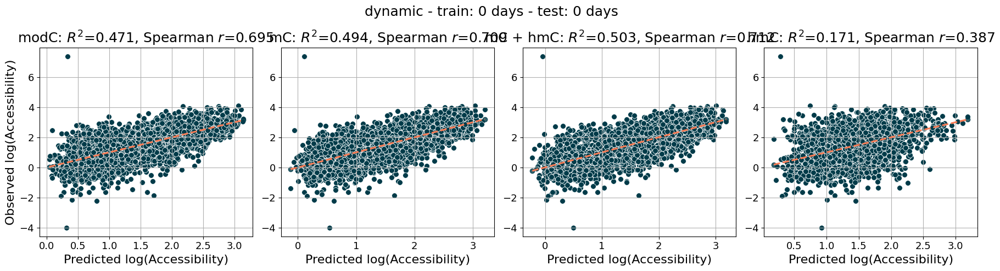

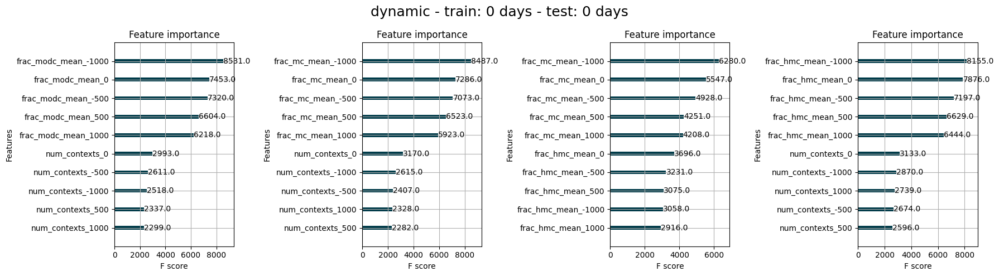

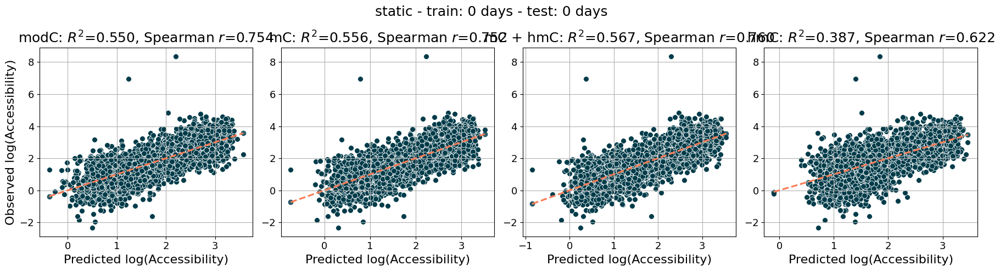

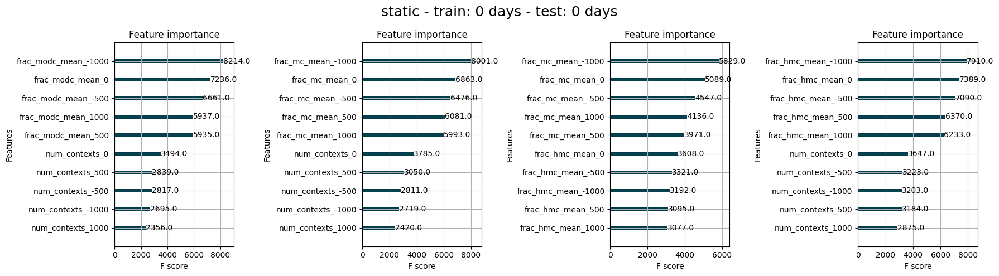

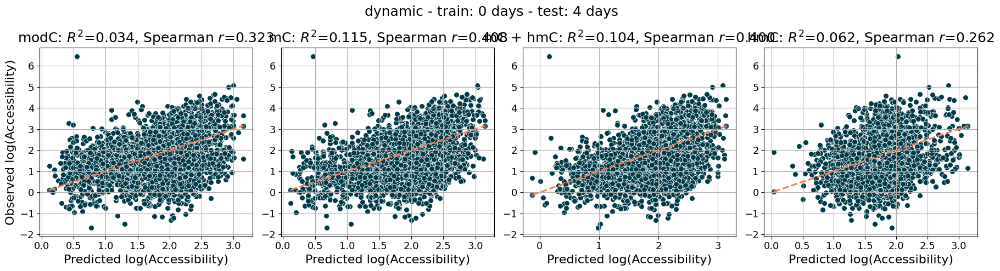

...

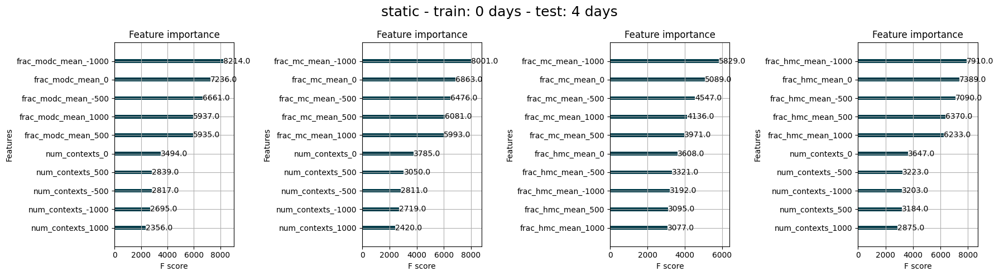

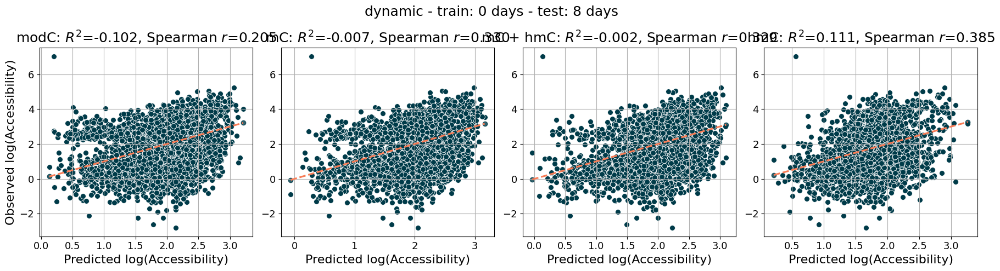

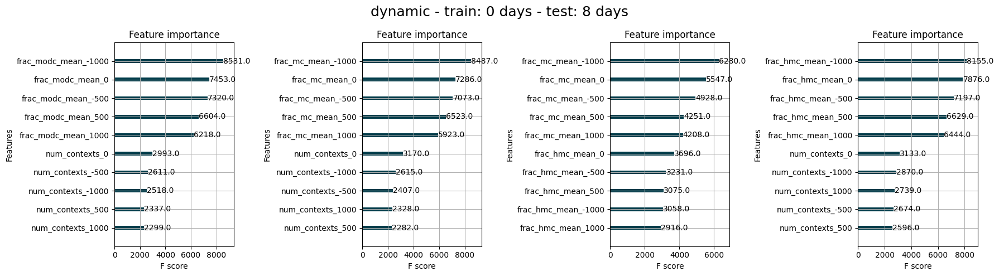

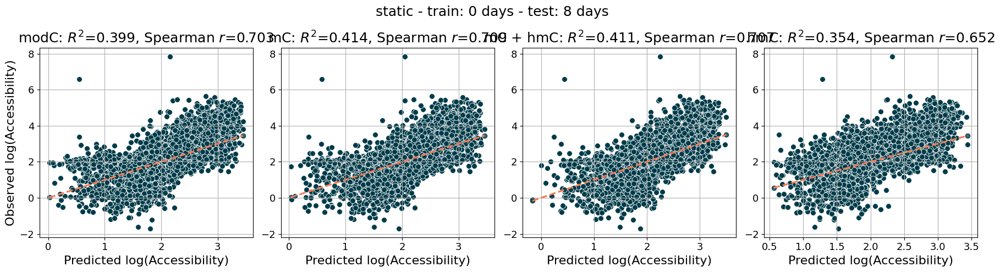

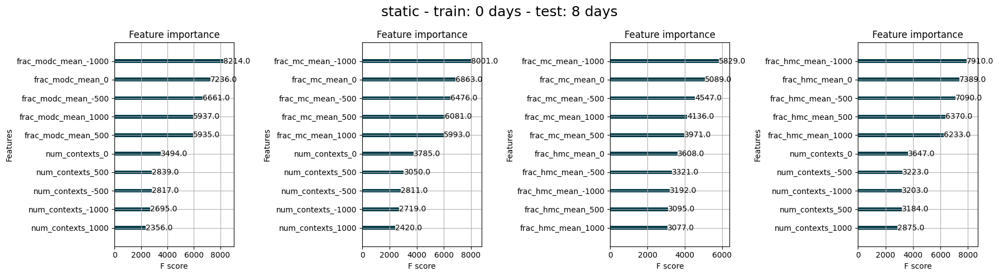

In [12]:
# 0 - predict 0
print("\n\nPredict - 0 hr")
for i in sets:
    print(i)
    predict_accessibility_from_timepoint_scatter(res_train = beds250_m0[i], res_test=beds250_m0[i], t1=0, t2=0, set_name=i, main_title = i+" - train: 0 days - test: 0 days", graphs=True)

# 0 - predict 4
print("\n\nPredict - 4 days")
for i in sets:
    print(i)
    predict_accessibility_from_timepoint_scatter(res_train = beds250_m0[i], res_test=beds250_m4[i], t1=0, t2=4, set_name=i, main_title = i+" - train: 0 days - test: 4 days", graphs=True)

# 0 - predict 8
print("\n\nPredict - 8 days")
for i in sets:
    print(i)
    predict_accessibility_from_timepoint_scatter(res_train = beds250_m0[i], res_test=beds250_m8[i], t1=0, t2=8, set_name=i, main_title = i+" - train: 0 days - test: 8 days", graphs=True)



Predict - 0 hr
dynamic
2024-06-27 15:57:44 | WARNING | [/data/hodges_lab/Tim/.conda/envs/jupyter_modality/lib/python3.11/site-packages/matplotlib/backends/backend_ps.py:280] The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
2024-06-27 15:57:44 | INFO | [/data/hodges_lab/Tim/.conda/envs/jupyter_modality/lib/python3.11/site-packages/fontTools/subset/__init__.py:3250] maxp pruned
2024-06-27 15:57:44 | INFO | [/data/hodges_lab/Tim/.conda/envs/jupyter_modality/lib/python3.11/site-packages/fontTools/subset/__init__.py:3250] cmap pruned
2024-06-27 15:57:44 | INFO | [/data/hodges_lab/Tim/.conda/envs/jupyter_modality/lib/python3.11/site-packages/fontTools/subset/__init__.py:3234] kern dropped
2024-06-27 15:57:44 | INFO | [/data/hodges_lab/Tim/.conda/envs/jupyter_modality/lib/python3.11/site-packages/fontTools/subset/__init__.py:3250] post pruned
2024-06-27 15:57:44 | INFO | [/data/hodges_lab/Tim/.conda/envs/jupyter_modality/lib/python

2024-06-27 15:57:44 | INFO | [/data/hodges_lab/Tim/.conda/envs/jupyter_modality/lib/python3.11/site-packages/fontTools/subset/__init__.py:3408] Retaining 51 glyphs
2024-06-27 15:57:44 | INFO | [/data/hodges_lab/Tim/.conda/envs/jupyter_modality/lib/python3.11/site-packages/fontTools/subset/__init__.py:3418] head subsetting not needed
2024-06-27 15:57:44 | INFO | [/data/hodges_lab/Tim/.conda/envs/jupyter_modality/lib/python3.11/site-packages/fontTools/subset/__init__.py:3418] hhea subsetting not needed
2024-06-27 15:57:44 | INFO | [/data/hodges_lab/Tim/.conda/envs/jupyter_modality/lib/python3.11/site-packages/fontTools/subset/__init__.py:3418] maxp subsetting not needed
2024-06-27 15:57:44 | INFO | [/data/hodges_lab/Tim/.conda/envs/jupyter_modality/lib/python3.11/site-packages/fontTools/subset/__init__.py:3418] OS/2 subsetting not needed
2024-06-27 15:57:44 | INFO | [/data/hodges_lab/Tim/.conda/envs/jupyter_modality/lib/python3.11/site-packages/fontTools/subset/__init__.py:3429] hmtx sub

2024-06-27 15:57:44 | INFO | [/data/hodges_lab/Tim/.conda/envs/jupyter_modality/lib/python3.11/site-packages/fontTools/subset/__init__.py:3408] Retaining 6 glyphs
2024-06-27 15:57:44 | INFO | [/data/hodges_lab/Tim/.conda/envs/jupyter_modality/lib/python3.11/site-packages/fontTools/subset/__init__.py:3418] head subsetting not needed
2024-06-27 15:57:44 | INFO | [/data/hodges_lab/Tim/.conda/envs/jupyter_modality/lib/python3.11/site-packages/fontTools/subset/__init__.py:3418] hhea subsetting not needed
2024-06-27 15:57:44 | INFO | [/data/hodges_lab/Tim/.conda/envs/jupyter_modality/lib/python3.11/site-packages/fontTools/subset/__init__.py:3418] maxp subsetting not needed
2024-06-27 15:57:44 | INFO | [/data/hodges_lab/Tim/.conda/envs/jupyter_modality/lib/python3.11/site-packages/fontTools/subset/__init__.py:3418] OS/2 subsetting not needed
2024-06-27 15:57:44 | INFO | [/data/hodges_lab/Tim/.conda/envs/jupyter_modality/lib/python3.11/site-packages/fontTools/subset/__init__.py:3429] hmtx subs

2024-06-27 15:58:42 | INFO | [/data/hodges_lab/Tim/.conda/envs/jupyter_modality/lib/python3.11/site-packages/fontTools/subset/__init__.py:3316] Closing glyph list over 'MATH': 46 glyphs before
2024-06-27 15:58:42 | INFO | [/data/hodges_lab/Tim/.conda/envs/jupyter_modality/lib/python3.11/site-packages/fontTools/subset/__init__.py:456] Glyph names: ['.notdef', '.null', 'A', 'C', 'O', 'P', 'S', 'a', 'b', 'c', 'colon', 'comma', 'd', 'e', 'eight', 'equal', 'five', 'four', 'g', 'h', 'hyphen', 'i', 'l', 'm', 'minus', 'n', 'nine', 'nonmarkingreturn', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'plus', 'r', 's', 'seven', 'six', 'space', 't', 'three', 'two', 'v', 'y', 'zero']
2024-06-27 15:58:42 | INFO | [/data/hodges_lab/Tim/.conda/envs/jupyter_modality/lib/python3.11/site-packages/fontTools/subset/__init__.py:459] Glyph IDs:   [0, 1, 2, 3, 11, 12, 14, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 32, 36, 38, 50, 51, 54, 68, 69, 70, 71, 72, 74, 75, 76, 79, 80, 81, 82, 83, 85

2024-06-27 15:58:42 | INFO | [/data/hodges_lab/Tim/.conda/envs/jupyter_modality/lib/python3.11/site-packages/fontTools/subset/__init__.py:3488] GDEF pruned
2024-06-27 15:58:42 | INFO | [/data/hodges_lab/Tim/.conda/envs/jupyter_modality/lib/python3.11/site-packages/fontTools/subset/__init__.py:3488] GPOS pruned
2024-06-27 15:58:42 | INFO | [/data/hodges_lab/Tim/.conda/envs/jupyter_modality/lib/python3.11/site-packages/fontTools/subset/__init__.py:3488] GSUB pruned
2024-06-27 15:58:42 | INFO | [/data/hodges_lab/Tim/.conda/envs/jupyter_modality/lib/python3.11/site-packages/fontTools/subset/__init__.py:3488] name pruned
2024-06-27 15:58:42 | INFO | [/data/hodges_lab/Tim/.conda/envs/jupyter_modality/lib/python3.11/site-packages/fontTools/subset/__init__.py:3250] maxp pruned
2024-06-27 15:58:42 | INFO | [/data/hodges_lab/Tim/.conda/envs/jupyter_modality/lib/python3.11/site-packages/fontTools/subset/__init__.py:3250] cmap pruned
2024-06-27 15:58:42 | INFO | [/data/hodges_lab/Tim/.conda/envs/j

2024-06-27 15:58:43 | INFO | [/data/hodges_lab/Tim/.conda/envs/jupyter_modality/lib/python3.11/site-packages/fontTools/subset/__init__.py:3488] GDEF pruned
2024-06-27 15:58:43 | INFO | [/data/hodges_lab/Tim/.conda/envs/jupyter_modality/lib/python3.11/site-packages/fontTools/subset/__init__.py:3488] GPOS pruned
2024-06-27 15:58:43 | INFO | [/data/hodges_lab/Tim/.conda/envs/jupyter_modality/lib/python3.11/site-packages/fontTools/subset/__init__.py:3488] GSUB pruned
2024-06-27 15:58:43 | INFO | [/data/hodges_lab/Tim/.conda/envs/jupyter_modality/lib/python3.11/site-packages/fontTools/subset/__init__.py:3488] name pruned
Results for:	modC	mC	mC+hmC	hmc
Mean Sq Err:	0.5546	0.5532	0.5443	0.7228
R-squared:	0.4552	0.4566	0.4652	0.2899
Pearson's r:	0.7223	0.7262	0.7293	0.6082
Spearman's r:	0.735	0.733	0.7361	0.6145


Predict - 4 days
dynamic
2024-06-27 15:59:44 | WARNING | [/data/hodges_lab/Tim/.conda/envs/jupyter_modality/lib/python3.11/site-packages/matplotlib/backends/backend_ps.py:280] The P

2024-06-27 15:59:44 | INFO | [/data/hodges_lab/Tim/.conda/envs/jupyter_modality/lib/python3.11/site-packages/fontTools/subset/__init__.py:456] Glyph names: ['.notdef', '.null', 'A', 'C', 'O', 'P', 'S', 'a', 'b', 'c', 'colon', 'comma', 'd', 'e', 'eight', 'equal', 'five', 'four', 'g', 'h', 'hyphen', 'i', 'l', 'm', 'minus', 'n', 'nine', 'nonmarkingreturn', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'plus', 'r', 's', 'seven', 'six', 'space', 't', 'three', 'two', 'uni239B', 'uni239C', 'uni239D', 'uni239E', 'uni239F', 'uni23A0', 'v', 'y', 'zero']
2024-06-27 15:59:44 | INFO | [/data/hodges_lab/Tim/.conda/envs/jupyter_modality/lib/python3.11/site-packages/fontTools/subset/__init__.py:459] Glyph IDs:   [0, 1, 2, 3, 11, 12, 14, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 32, 36, 38, 50, 51, 54, 68, 69, 70, 71, 72, 74, 75, 76, 79, 80, 81, 82, 83, 85, 86, 87, 89, 92, 3228, 3506, 3507, 3508, 3509, 3510, 3511]
2024-06-27 15:59:44 | INFO | [/data/hodges_lab/Tim/.conda/envs/jupy

2024-06-27 15:59:44 | INFO | [/data/hodges_lab/Tim/.conda/envs/jupyter_modality/lib/python3.11/site-packages/fontTools/subset/__init__.py:456] Glyph names: ['.notdef', '.null', 'R', 'nonmarkingreturn', 'r', 'space']
2024-06-27 15:59:44 | INFO | [/data/hodges_lab/Tim/.conda/envs/jupyter_modality/lib/python3.11/site-packages/fontTools/subset/__init__.py:459] Glyph IDs:   [0, 1, 2, 3, 53, 85]
2024-06-27 15:59:44 | INFO | [/data/hodges_lab/Tim/.conda/envs/jupyter_modality/lib/python3.11/site-packages/fontTools/subset/__init__.py:3355] Closed glyph list over 'glyf': 6 glyphs after
2024-06-27 15:59:44 | INFO | [/data/hodges_lab/Tim/.conda/envs/jupyter_modality/lib/python3.11/site-packages/fontTools/subset/__init__.py:456] Glyph names: ['.notdef', '.null', 'R', 'nonmarkingreturn', 'r', 'space']
2024-06-27 15:59:44 | INFO | [/data/hodges_lab/Tim/.conda/envs/jupyter_modality/lib/python3.11/site-packages/fontTools/subset/__init__.py:459] Glyph IDs:   [0, 1, 2, 3, 53, 85]
2024-06-27 15:59:44 | IN

2024-06-27 16:00:40 | INFO | [/data/hodges_lab/Tim/.conda/envs/jupyter_modality/lib/python3.11/site-packages/fontTools/subset/__init__.py:3308] Closed glyph list over 'GSUB': 45 glyphs after
2024-06-27 16:00:40 | INFO | [/data/hodges_lab/Tim/.conda/envs/jupyter_modality/lib/python3.11/site-packages/fontTools/subset/__init__.py:456] Glyph names: ['.notdef', '.null', 'A', 'C', 'O', 'P', 'S', 'a', 'b', 'c', 'colon', 'comma', 'd', 'e', 'eight', 'equal', 'five', 'four', 'g', 'h', 'hyphen', 'i', 'l', 'm', 'n', 'nine', 'nonmarkingreturn', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'plus', 'r', 's', 'seven', 'six', 'space', 't', 'three', 'two', 'v', 'y', 'zero']
2024-06-27 16:00:40 | INFO | [/data/hodges_lab/Tim/.conda/envs/jupyter_modality/lib/python3.11/site-packages/fontTools/subset/__init__.py:459] Glyph IDs:   [0, 1, 2, 3, 11, 12, 14, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 32, 36, 38, 50, 51, 54, 68, 69, 70, 71, 72, 74, 75, 76, 79, 80, 81, 82, 83, 85, 86, 87, 8

2024-06-27 16:00:40 | INFO | [/data/hodges_lab/Tim/.conda/envs/jupyter_modality/lib/python3.11/site-packages/fontTools/subset/__init__.py:3429] glyf subsetted
2024-06-27 16:00:40 | INFO | [/data/hodges_lab/Tim/.conda/envs/jupyter_modality/lib/python3.11/site-packages/fontTools/subset/__init__.py:3488] head pruned
2024-06-27 16:00:40 | INFO | [/data/hodges_lab/Tim/.conda/envs/jupyter_modality/lib/python3.11/site-packages/fontTools/subset/__init__.py:3455] OS/2 Unicode ranges pruned: [0]
2024-06-27 16:00:40 | INFO | [/data/hodges_lab/Tim/.conda/envs/jupyter_modality/lib/python3.11/site-packages/fontTools/subset/__init__.py:3464] OS/2 CodePage ranges pruned: [0]
2024-06-27 16:00:40 | INFO | [/data/hodges_lab/Tim/.conda/envs/jupyter_modality/lib/python3.11/site-packages/fontTools/subset/__init__.py:3488] glyf pruned
2024-06-27 16:00:40 | INFO | [/data/hodges_lab/Tim/.conda/envs/jupyter_modality/lib/python3.11/site-packages/fontTools/subset/__init__.py:3488] GDEF pruned
2024-06-27 16:00:40 

2024-06-27 16:00:40 | INFO | [/data/hodges_lab/Tim/.conda/envs/jupyter_modality/lib/python3.11/site-packages/fontTools/subset/__init__.py:3429] glyf subsetted
2024-06-27 16:00:40 | INFO | [/data/hodges_lab/Tim/.conda/envs/jupyter_modality/lib/python3.11/site-packages/fontTools/subset/__init__.py:3488] head pruned
2024-06-27 16:00:40 | INFO | [/data/hodges_lab/Tim/.conda/envs/jupyter_modality/lib/python3.11/site-packages/fontTools/subset/__init__.py:3455] OS/2 Unicode ranges pruned: [0]
2024-06-27 16:00:40 | INFO | [/data/hodges_lab/Tim/.conda/envs/jupyter_modality/lib/python3.11/site-packages/fontTools/subset/__init__.py:3464] OS/2 CodePage ranges pruned: [0]
2024-06-27 16:00:40 | INFO | [/data/hodges_lab/Tim/.conda/envs/jupyter_modality/lib/python3.11/site-packages/fontTools/subset/__init__.py:3488] glyf pruned
2024-06-27 16:00:40 | INFO | [/data/hodges_lab/Tim/.conda/envs/jupyter_modality/lib/python3.11/site-packages/fontTools/subset/__init__.py:3488] GDEF pruned
2024-06-27 16:00:40 

2024-06-27 16:01:37 | INFO | [/data/hodges_lab/Tim/.conda/envs/jupyter_modality/lib/python3.11/site-packages/fontTools/subset/__init__.py:459] Glyph IDs:   [0, 1, 2, 3, 11, 12, 14, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 27, 28, 29, 32, 36, 38, 50, 51, 54, 68, 69, 70, 71, 72, 74, 75, 76, 79, 80, 81, 82, 83, 85, 86, 87, 89, 92, 3228, 3506, 3507, 3508, 3509, 3510, 3511]
2024-06-27 16:01:37 | INFO | [/data/hodges_lab/Tim/.conda/envs/jupyter_modality/lib/python3.11/site-packages/fontTools/subset/__init__.py:3355] Closed glyph list over 'glyf': 51 glyphs after
2024-06-27 16:01:37 | INFO | [/data/hodges_lab/Tim/.conda/envs/jupyter_modality/lib/python3.11/site-packages/fontTools/subset/__init__.py:456] Glyph names: ['.notdef', '.null', 'A', 'C', 'O', 'P', 'S', 'a', 'b', 'c', 'colon', 'comma', 'd', 'e', 'eight', 'equal', 'five', 'four', 'g', 'h', 'hyphen', 'i', 'l', 'm', 'minus', 'n', 'nine', 'nonmarkingreturn', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'plus', 'r', 's', 'six', 'sp

2024-06-27 16:01:37 | INFO | [/data/hodges_lab/Tim/.conda/envs/jupyter_modality/lib/python3.11/site-packages/fontTools/subset/__init__.py:456] Glyph names: ['.notdef', '.null', 'R', 'nonmarkingreturn', 'r', 'space']
2024-06-27 16:01:37 | INFO | [/data/hodges_lab/Tim/.conda/envs/jupyter_modality/lib/python3.11/site-packages/fontTools/subset/__init__.py:459] Glyph IDs:   [0, 1, 2, 3, 53, 85]
2024-06-27 16:01:37 | INFO | [/data/hodges_lab/Tim/.conda/envs/jupyter_modality/lib/python3.11/site-packages/fontTools/subset/__init__.py:3349] Closing glyph list over 'glyf': 6 glyphs before
2024-06-27 16:01:37 | INFO | [/data/hodges_lab/Tim/.conda/envs/jupyter_modality/lib/python3.11/site-packages/fontTools/subset/__init__.py:456] Glyph names: ['.notdef', '.null', 'R', 'nonmarkingreturn', 'r', 'space']
2024-06-27 16:01:37 | INFO | [/data/hodges_lab/Tim/.conda/envs/jupyter_modality/lib/python3.11/site-packages/fontTools/subset/__init__.py:459] Glyph IDs:   [0, 1, 2, 3, 53, 85]
2024-06-27 16:01:37 | 

2024-06-27 16:02:33 | INFO | [/data/hodges_lab/Tim/.conda/envs/jupyter_modality/lib/python3.11/site-packages/fontTools/subset/__init__.py:459] Glyph IDs:   [0, 1, 2, 3, 11, 12, 14, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 32, 36, 38, 50, 51, 54, 68, 69, 70, 71, 72, 74, 75, 76, 79, 80, 81, 82, 83, 85, 86, 87, 89, 92, 3228]
2024-06-27 16:02:33 | INFO | [/data/hodges_lab/Tim/.conda/envs/jupyter_modality/lib/python3.11/site-packages/fontTools/subset/__init__.py:3308] Closed glyph list over 'GSUB': 46 glyphs after
2024-06-27 16:02:33 | INFO | [/data/hodges_lab/Tim/.conda/envs/jupyter_modality/lib/python3.11/site-packages/fontTools/subset/__init__.py:456] Glyph names: ['.notdef', '.null', 'A', 'C', 'O', 'P', 'S', 'a', 'b', 'c', 'colon', 'comma', 'd', 'e', 'eight', 'equal', 'five', 'four', 'g', 'h', 'hyphen', 'i', 'l', 'm', 'minus', 'n', 'nine', 'nonmarkingreturn', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'plus', 'r', 's', 'seven', 'six', 'space', 't', 'three', 'tw

2024-06-27 16:02:33 | INFO | [/data/hodges_lab/Tim/.conda/envs/jupyter_modality/lib/python3.11/site-packages/fontTools/subset/__init__.py:3429] GPOS subsetted
2024-06-27 16:02:33 | INFO | [/data/hodges_lab/Tim/.conda/envs/jupyter_modality/lib/python3.11/site-packages/fontTools/subset/__init__.py:3429] GSUB subsetted
2024-06-27 16:02:33 | INFO | [/data/hodges_lab/Tim/.conda/envs/jupyter_modality/lib/python3.11/site-packages/fontTools/subset/__init__.py:3418] name subsetting not needed
2024-06-27 16:02:33 | INFO | [/data/hodges_lab/Tim/.conda/envs/jupyter_modality/lib/python3.11/site-packages/fontTools/subset/__init__.py:3429] glyf subsetted
2024-06-27 16:02:33 | INFO | [/data/hodges_lab/Tim/.conda/envs/jupyter_modality/lib/python3.11/site-packages/fontTools/subset/__init__.py:3488] head pruned
2024-06-27 16:02:33 | INFO | [/data/hodges_lab/Tim/.conda/envs/jupyter_modality/lib/python3.11/site-packages/fontTools/subset/__init__.py:3455] OS/2 Unicode ranges pruned: [0, 38]
2024-06-27 16:02

2024-06-27 16:02:33 | INFO | [/data/hodges_lab/Tim/.conda/envs/jupyter_modality/lib/python3.11/site-packages/fontTools/subset/__init__.py:3429] GPOS subsetted
2024-06-27 16:02:33 | INFO | [/data/hodges_lab/Tim/.conda/envs/jupyter_modality/lib/python3.11/site-packages/fontTools/subset/__init__.py:3429] GSUB subsetted
2024-06-27 16:02:33 | INFO | [/data/hodges_lab/Tim/.conda/envs/jupyter_modality/lib/python3.11/site-packages/fontTools/subset/__init__.py:3418] name subsetting not needed
2024-06-27 16:02:33 | INFO | [/data/hodges_lab/Tim/.conda/envs/jupyter_modality/lib/python3.11/site-packages/fontTools/subset/__init__.py:3429] glyf subsetted
2024-06-27 16:02:33 | INFO | [/data/hodges_lab/Tim/.conda/envs/jupyter_modality/lib/python3.11/site-packages/fontTools/subset/__init__.py:3488] head pruned
2024-06-27 16:02:33 | INFO | [/data/hodges_lab/Tim/.conda/envs/jupyter_modality/lib/python3.11/site-packages/fontTools/subset/__init__.py:3455] OS/2 Unicode ranges pruned: [0]
2024-06-27 16:02:33 

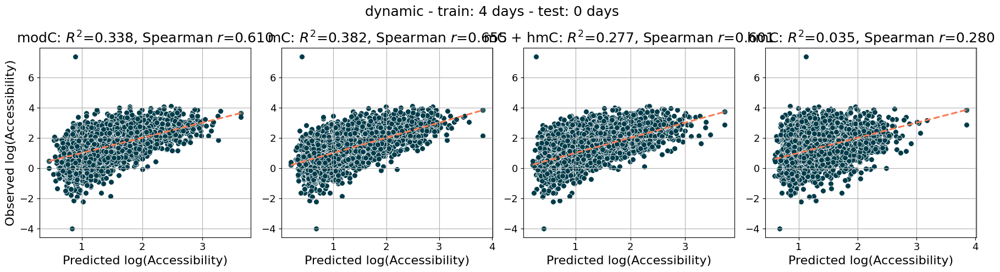

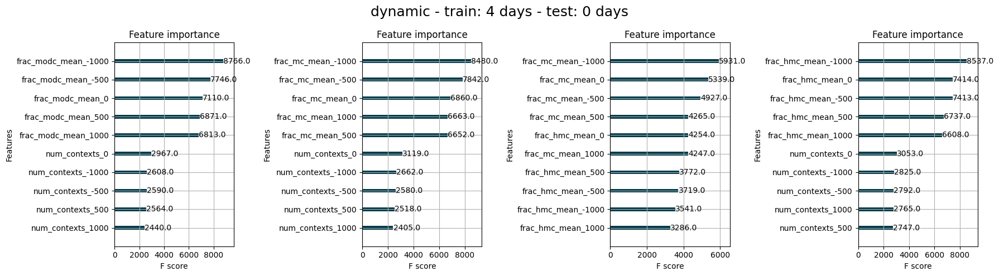

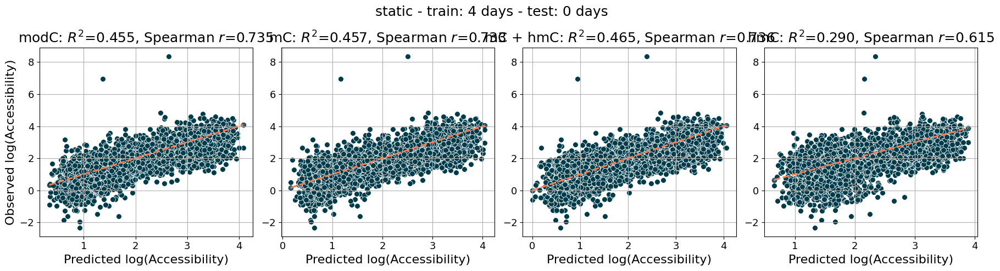

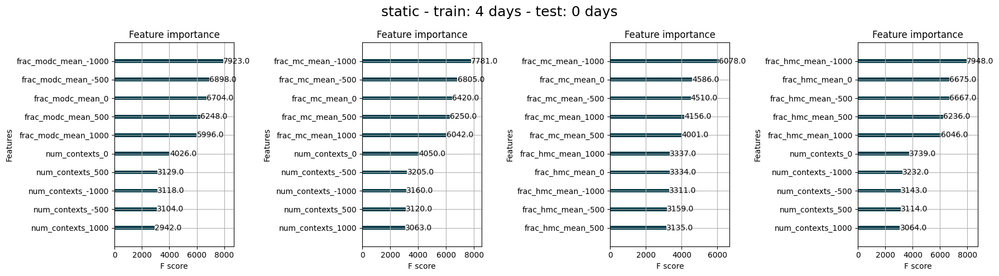

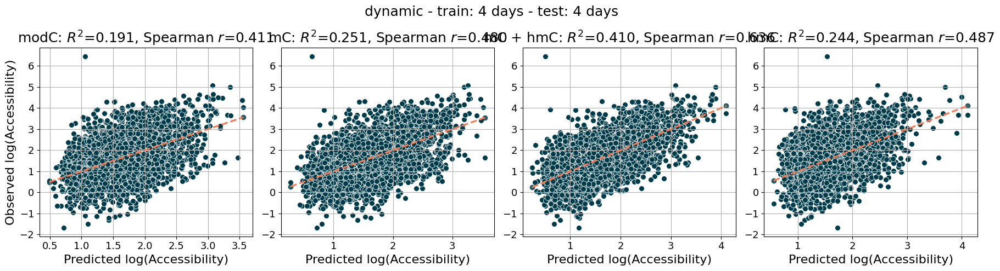

...

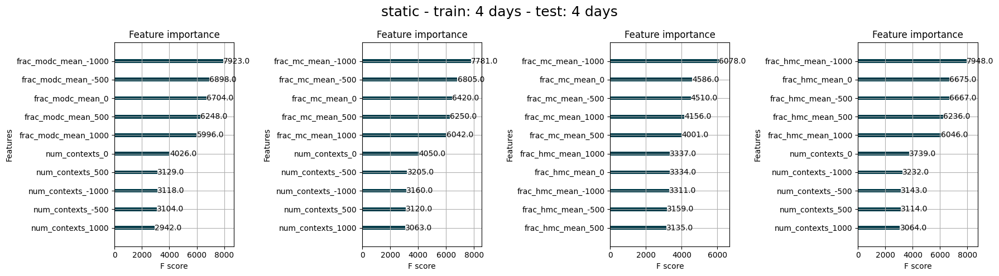

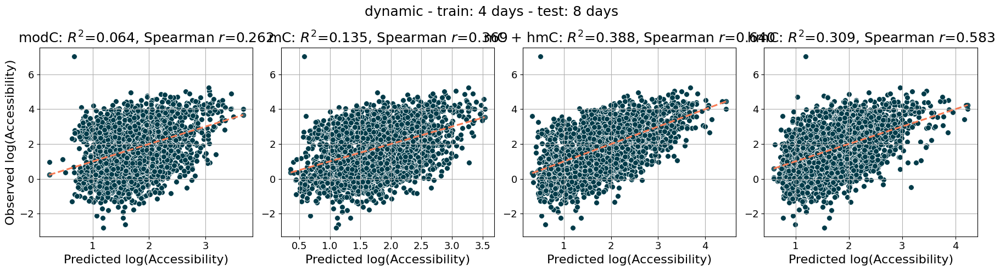

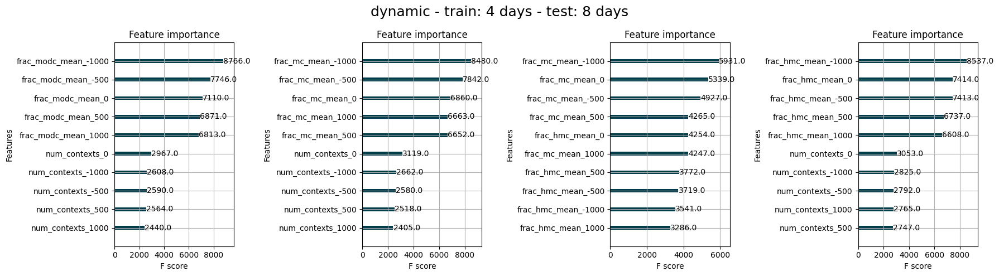

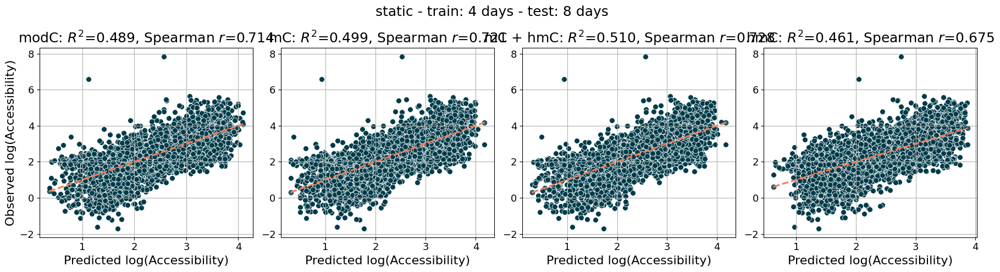

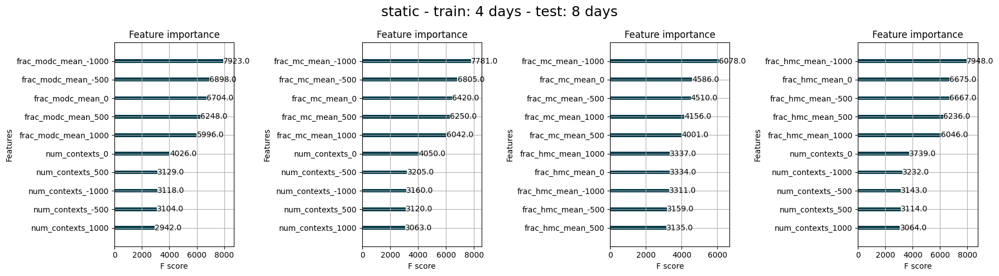

In [13]:
# 4 - predict 0
print("\n\nPredict - 0 hr")
for i in sets:
    print(i)
    predict_accessibility_from_timepoint_scatter(res_train = beds250_m4[i], res_test=beds250_m0[i], t1=4, t2=0, set_name=i, main_title = i+" - train: 4 days - test: 0 days", graphs=True)

# 4 - predict 4
print("\n\nPredict - 4 days")
for i in sets:
    print(i)
    predict_accessibility_from_timepoint_scatter(res_train = beds250_m4[i], res_test=beds250_m4[i], t1=4, t2=4, set_name=i, main_title = i+" - train: 4 days - test: 4 days", graphs=True)

# 4 - predict 8
print("\n\nPredict - 8 days")
for i in sets:
    print(i)
    predict_accessibility_from_timepoint_scatter(res_train = beds250_m4[i], res_test=beds250_m8[i], t1=4, t2=8, set_name=i, main_title = i+" - train: 4 days - test: 8 days", graphs=True)



Predict - 0 hr
dynamic
2024-06-27 16:03:37 | WARNING | [/data/hodges_lab/Tim/.conda/envs/jupyter_modality/lib/python3.11/site-packages/matplotlib/backends/backend_ps.py:280] The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
2024-06-27 16:03:38 | INFO | [/data/hodges_lab/Tim/.conda/envs/jupyter_modality/lib/python3.11/site-packages/fontTools/subset/__init__.py:3250] maxp pruned
2024-06-27 16:03:38 | INFO | [/data/hodges_lab/Tim/.conda/envs/jupyter_modality/lib/python3.11/site-packages/fontTools/subset/__init__.py:3250] cmap pruned
2024-06-27 16:03:38 | INFO | [/data/hodges_lab/Tim/.conda/envs/jupyter_modality/lib/python3.11/site-packages/fontTools/subset/__init__.py:3234] kern dropped
2024-06-27 16:03:38 | INFO | [/data/hodges_lab/Tim/.conda/envs/jupyter_modality/lib/python3.11/site-packages/fontTools/subset/__init__.py:3250] post pruned
2024-06-27 16:03:38 | INFO | [/data/hodges_lab/Tim/.conda/envs/jupyter_modality/lib/python

2024-06-27 16:03:38 | INFO | [/data/hodges_lab/Tim/.conda/envs/jupyter_modality/lib/python3.11/site-packages/fontTools/subset/__init__.py:3408] Retaining 52 glyphs
2024-06-27 16:03:38 | INFO | [/data/hodges_lab/Tim/.conda/envs/jupyter_modality/lib/python3.11/site-packages/fontTools/subset/__init__.py:3418] head subsetting not needed
2024-06-27 16:03:38 | INFO | [/data/hodges_lab/Tim/.conda/envs/jupyter_modality/lib/python3.11/site-packages/fontTools/subset/__init__.py:3418] hhea subsetting not needed
2024-06-27 16:03:38 | INFO | [/data/hodges_lab/Tim/.conda/envs/jupyter_modality/lib/python3.11/site-packages/fontTools/subset/__init__.py:3418] maxp subsetting not needed
2024-06-27 16:03:38 | INFO | [/data/hodges_lab/Tim/.conda/envs/jupyter_modality/lib/python3.11/site-packages/fontTools/subset/__init__.py:3418] OS/2 subsetting not needed
2024-06-27 16:03:38 | INFO | [/data/hodges_lab/Tim/.conda/envs/jupyter_modality/lib/python3.11/site-packages/fontTools/subset/__init__.py:3429] hmtx sub

2024-06-27 16:03:38 | INFO | [/data/hodges_lab/Tim/.conda/envs/jupyter_modality/lib/python3.11/site-packages/fontTools/subset/__init__.py:3408] Retaining 6 glyphs
2024-06-27 16:03:38 | INFO | [/data/hodges_lab/Tim/.conda/envs/jupyter_modality/lib/python3.11/site-packages/fontTools/subset/__init__.py:3418] head subsetting not needed
2024-06-27 16:03:38 | INFO | [/data/hodges_lab/Tim/.conda/envs/jupyter_modality/lib/python3.11/site-packages/fontTools/subset/__init__.py:3418] hhea subsetting not needed
2024-06-27 16:03:38 | INFO | [/data/hodges_lab/Tim/.conda/envs/jupyter_modality/lib/python3.11/site-packages/fontTools/subset/__init__.py:3418] maxp subsetting not needed
2024-06-27 16:03:38 | INFO | [/data/hodges_lab/Tim/.conda/envs/jupyter_modality/lib/python3.11/site-packages/fontTools/subset/__init__.py:3418] OS/2 subsetting not needed
2024-06-27 16:03:38 | INFO | [/data/hodges_lab/Tim/.conda/envs/jupyter_modality/lib/python3.11/site-packages/fontTools/subset/__init__.py:3429] hmtx subs

2024-06-27 16:04:36 | INFO | [/data/hodges_lab/Tim/.conda/envs/jupyter_modality/lib/python3.11/site-packages/fontTools/subset/__init__.py:3316] Closing glyph list over 'MATH': 46 glyphs before
2024-06-27 16:04:36 | INFO | [/data/hodges_lab/Tim/.conda/envs/jupyter_modality/lib/python3.11/site-packages/fontTools/subset/__init__.py:456] Glyph names: ['.notdef', '.null', 'A', 'C', 'O', 'P', 'S', 'a', 'b', 'c', 'colon', 'comma', 'd', 'e', 'eight', 'equal', 'five', 'four', 'g', 'h', 'hyphen', 'i', 'l', 'm', 'minus', 'n', 'nine', 'nonmarkingreturn', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'plus', 'r', 's', 'seven', 'six', 'space', 't', 'three', 'two', 'v', 'y', 'zero']
2024-06-27 16:04:36 | INFO | [/data/hodges_lab/Tim/.conda/envs/jupyter_modality/lib/python3.11/site-packages/fontTools/subset/__init__.py:459] Glyph IDs:   [0, 1, 2, 3, 11, 12, 14, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 32, 36, 38, 50, 51, 54, 68, 69, 70, 71, 72, 74, 75, 76, 79, 80, 81, 82, 83, 85

2024-06-27 16:04:36 | INFO | [/data/hodges_lab/Tim/.conda/envs/jupyter_modality/lib/python3.11/site-packages/fontTools/subset/__init__.py:3488] GDEF pruned
2024-06-27 16:04:36 | INFO | [/data/hodges_lab/Tim/.conda/envs/jupyter_modality/lib/python3.11/site-packages/fontTools/subset/__init__.py:3488] GPOS pruned
2024-06-27 16:04:36 | INFO | [/data/hodges_lab/Tim/.conda/envs/jupyter_modality/lib/python3.11/site-packages/fontTools/subset/__init__.py:3488] GSUB pruned
2024-06-27 16:04:36 | INFO | [/data/hodges_lab/Tim/.conda/envs/jupyter_modality/lib/python3.11/site-packages/fontTools/subset/__init__.py:3488] name pruned
2024-06-27 16:04:36 | INFO | [/data/hodges_lab/Tim/.conda/envs/jupyter_modality/lib/python3.11/site-packages/fontTools/subset/__init__.py:3250] maxp pruned
2024-06-27 16:04:36 | INFO | [/data/hodges_lab/Tim/.conda/envs/jupyter_modality/lib/python3.11/site-packages/fontTools/subset/__init__.py:3250] cmap pruned
2024-06-27 16:04:36 | INFO | [/data/hodges_lab/Tim/.conda/envs/j

2024-06-27 16:04:36 | INFO | [/data/hodges_lab/Tim/.conda/envs/jupyter_modality/lib/python3.11/site-packages/fontTools/subset/__init__.py:3488] GDEF pruned
2024-06-27 16:04:36 | INFO | [/data/hodges_lab/Tim/.conda/envs/jupyter_modality/lib/python3.11/site-packages/fontTools/subset/__init__.py:3488] GPOS pruned
2024-06-27 16:04:36 | INFO | [/data/hodges_lab/Tim/.conda/envs/jupyter_modality/lib/python3.11/site-packages/fontTools/subset/__init__.py:3488] GSUB pruned
2024-06-27 16:04:36 | INFO | [/data/hodges_lab/Tim/.conda/envs/jupyter_modality/lib/python3.11/site-packages/fontTools/subset/__init__.py:3488] name pruned
Results for:	modC	mC	mC+hmC	hmc
Mean Sq Err:	0.6395	0.6192	0.6179	0.7467
R-squared:	0.3718	0.3917	0.393	0.2664
Pearson's r:	0.6713	0.6879	0.6898	0.5941
Spearman's r:	0.7049	0.7174	0.7121	0.5995


Predict - 4 days
dynamic
2024-06-27 16:05:32 | WARNING | [/data/hodges_lab/Tim/.conda/envs/jupyter_modality/lib/python3.11/site-packages/matplotlib/backends/backend_ps.py:280] The 

2024-06-27 16:05:32 | INFO | [/data/hodges_lab/Tim/.conda/envs/jupyter_modality/lib/python3.11/site-packages/fontTools/subset/__init__.py:456] Glyph names: ['.notdef', '.null', 'A', 'C', 'O', 'P', 'S', 'a', 'b', 'c', 'colon', 'comma', 'd', 'e', 'eight', 'equal', 'five', 'four', 'g', 'h', 'hyphen', 'i', 'l', 'm', 'minus', 'n', 'nine', 'nonmarkingreturn', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'plus', 'r', 's', 'seven', 'six', 'space', 't', 'three', 'two', 'uni239B', 'uni239C', 'uni239D', 'uni239E', 'uni239F', 'uni23A0', 'v', 'y', 'zero']
2024-06-27 16:05:32 | INFO | [/data/hodges_lab/Tim/.conda/envs/jupyter_modality/lib/python3.11/site-packages/fontTools/subset/__init__.py:459] Glyph IDs:   [0, 1, 2, 3, 11, 12, 14, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 32, 36, 38, 50, 51, 54, 68, 69, 70, 71, 72, 74, 75, 76, 79, 80, 81, 82, 83, 85, 86, 87, 89, 92, 3228, 3506, 3507, 3508, 3509, 3510, 3511]
2024-06-27 16:05:32 | INFO | [/data/hodges_lab/Tim/.conda/envs/jupy

2024-06-27 16:05:32 | INFO | [/data/hodges_lab/Tim/.conda/envs/jupyter_modality/lib/python3.11/site-packages/fontTools/subset/__init__.py:456] Glyph names: ['.notdef', '.null', 'R', 'nonmarkingreturn', 'r', 'space']
2024-06-27 16:05:32 | INFO | [/data/hodges_lab/Tim/.conda/envs/jupyter_modality/lib/python3.11/site-packages/fontTools/subset/__init__.py:459] Glyph IDs:   [0, 1, 2, 3, 53, 85]
2024-06-27 16:05:32 | INFO | [/data/hodges_lab/Tim/.conda/envs/jupyter_modality/lib/python3.11/site-packages/fontTools/subset/__init__.py:3355] Closed glyph list over 'glyf': 6 glyphs after
2024-06-27 16:05:32 | INFO | [/data/hodges_lab/Tim/.conda/envs/jupyter_modality/lib/python3.11/site-packages/fontTools/subset/__init__.py:456] Glyph names: ['.notdef', '.null', 'R', 'nonmarkingreturn', 'r', 'space']
2024-06-27 16:05:32 | INFO | [/data/hodges_lab/Tim/.conda/envs/jupyter_modality/lib/python3.11/site-packages/fontTools/subset/__init__.py:459] Glyph IDs:   [0, 1, 2, 3, 53, 85]
2024-06-27 16:05:32 | IN

2024-06-27 16:06:29 | INFO | [/data/hodges_lab/Tim/.conda/envs/jupyter_modality/lib/python3.11/site-packages/fontTools/subset/__init__.py:3308] Closed glyph list over 'GSUB': 45 glyphs after
2024-06-27 16:06:29 | INFO | [/data/hodges_lab/Tim/.conda/envs/jupyter_modality/lib/python3.11/site-packages/fontTools/subset/__init__.py:456] Glyph names: ['.notdef', '.null', 'A', 'C', 'O', 'P', 'S', 'a', 'b', 'c', 'colon', 'comma', 'd', 'e', 'eight', 'equal', 'five', 'four', 'g', 'h', 'hyphen', 'i', 'l', 'm', 'n', 'nine', 'nonmarkingreturn', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'plus', 'r', 's', 'seven', 'six', 'space', 't', 'three', 'two', 'v', 'y', 'zero']
2024-06-27 16:06:29 | INFO | [/data/hodges_lab/Tim/.conda/envs/jupyter_modality/lib/python3.11/site-packages/fontTools/subset/__init__.py:459] Glyph IDs:   [0, 1, 2, 3, 11, 12, 14, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 32, 36, 38, 50, 51, 54, 68, 69, 70, 71, 72, 74, 75, 76, 79, 80, 81, 82, 83, 85, 86, 87, 8

2024-06-27 16:06:29 | INFO | [/data/hodges_lab/Tim/.conda/envs/jupyter_modality/lib/python3.11/site-packages/fontTools/subset/__init__.py:3429] glyf subsetted
2024-06-27 16:06:29 | INFO | [/data/hodges_lab/Tim/.conda/envs/jupyter_modality/lib/python3.11/site-packages/fontTools/subset/__init__.py:3488] head pruned
2024-06-27 16:06:29 | INFO | [/data/hodges_lab/Tim/.conda/envs/jupyter_modality/lib/python3.11/site-packages/fontTools/subset/__init__.py:3455] OS/2 Unicode ranges pruned: [0]
2024-06-27 16:06:29 | INFO | [/data/hodges_lab/Tim/.conda/envs/jupyter_modality/lib/python3.11/site-packages/fontTools/subset/__init__.py:3464] OS/2 CodePage ranges pruned: [0]
2024-06-27 16:06:29 | INFO | [/data/hodges_lab/Tim/.conda/envs/jupyter_modality/lib/python3.11/site-packages/fontTools/subset/__init__.py:3488] glyf pruned
2024-06-27 16:06:29 | INFO | [/data/hodges_lab/Tim/.conda/envs/jupyter_modality/lib/python3.11/site-packages/fontTools/subset/__init__.py:3488] GDEF pruned
2024-06-27 16:06:29 

2024-06-27 16:06:29 | INFO | [/data/hodges_lab/Tim/.conda/envs/jupyter_modality/lib/python3.11/site-packages/fontTools/subset/__init__.py:3429] glyf subsetted
2024-06-27 16:06:29 | INFO | [/data/hodges_lab/Tim/.conda/envs/jupyter_modality/lib/python3.11/site-packages/fontTools/subset/__init__.py:3488] head pruned
2024-06-27 16:06:29 | INFO | [/data/hodges_lab/Tim/.conda/envs/jupyter_modality/lib/python3.11/site-packages/fontTools/subset/__init__.py:3455] OS/2 Unicode ranges pruned: [0]
2024-06-27 16:06:29 | INFO | [/data/hodges_lab/Tim/.conda/envs/jupyter_modality/lib/python3.11/site-packages/fontTools/subset/__init__.py:3464] OS/2 CodePage ranges pruned: [0]
2024-06-27 16:06:29 | INFO | [/data/hodges_lab/Tim/.conda/envs/jupyter_modality/lib/python3.11/site-packages/fontTools/subset/__init__.py:3488] glyf pruned
2024-06-27 16:06:29 | INFO | [/data/hodges_lab/Tim/.conda/envs/jupyter_modality/lib/python3.11/site-packages/fontTools/subset/__init__.py:3488] GDEF pruned
2024-06-27 16:06:29 

2024-06-27 16:07:28 | INFO | [/data/hodges_lab/Tim/.conda/envs/jupyter_modality/lib/python3.11/site-packages/fontTools/subset/__init__.py:459] Glyph IDs:   [0, 1, 2, 3, 11, 12, 14, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 32, 36, 38, 50, 51, 54, 68, 69, 70, 71, 72, 74, 75, 76, 79, 80, 81, 82, 83, 85, 86, 87, 89, 92, 3228, 3506, 3507, 3508, 3509, 3510, 3511]
2024-06-27 16:07:28 | INFO | [/data/hodges_lab/Tim/.conda/envs/jupyter_modality/lib/python3.11/site-packages/fontTools/subset/__init__.py:3355] Closed glyph list over 'glyf': 52 glyphs after
2024-06-27 16:07:28 | INFO | [/data/hodges_lab/Tim/.conda/envs/jupyter_modality/lib/python3.11/site-packages/fontTools/subset/__init__.py:456] Glyph names: ['.notdef', '.null', 'A', 'C', 'O', 'P', 'S', 'a', 'b', 'c', 'colon', 'comma', 'd', 'e', 'eight', 'equal', 'five', 'four', 'g', 'h', 'hyphen', 'i', 'l', 'm', 'minus', 'n', 'nine', 'nonmarkingreturn', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'plus', 'r', 's', 'seven

2024-06-27 16:07:28 | INFO | [/data/hodges_lab/Tim/.conda/envs/jupyter_modality/lib/python3.11/site-packages/fontTools/subset/__init__.py:456] Glyph names: ['.notdef', '.null', 'R', 'nonmarkingreturn', 'r', 'space']
2024-06-27 16:07:28 | INFO | [/data/hodges_lab/Tim/.conda/envs/jupyter_modality/lib/python3.11/site-packages/fontTools/subset/__init__.py:459] Glyph IDs:   [0, 1, 2, 3, 53, 85]
2024-06-27 16:07:28 | INFO | [/data/hodges_lab/Tim/.conda/envs/jupyter_modality/lib/python3.11/site-packages/fontTools/subset/__init__.py:3349] Closing glyph list over 'glyf': 6 glyphs before
2024-06-27 16:07:28 | INFO | [/data/hodges_lab/Tim/.conda/envs/jupyter_modality/lib/python3.11/site-packages/fontTools/subset/__init__.py:456] Glyph names: ['.notdef', '.null', 'R', 'nonmarkingreturn', 'r', 'space']
2024-06-27 16:07:28 | INFO | [/data/hodges_lab/Tim/.conda/envs/jupyter_modality/lib/python3.11/site-packages/fontTools/subset/__init__.py:459] Glyph IDs:   [0, 1, 2, 3, 53, 85]
2024-06-27 16:07:28 | 

2024-06-27 16:08:27 | INFO | [/data/hodges_lab/Tim/.conda/envs/jupyter_modality/lib/python3.11/site-packages/fontTools/subset/__init__.py:459] Glyph IDs:   [0, 1, 2, 3, 11, 12, 14, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 26, 27, 29, 32, 36, 38, 50, 51, 54, 68, 69, 70, 71, 72, 74, 75, 76, 79, 80, 81, 82, 83, 85, 86, 87, 89, 92, 3228]
2024-06-27 16:08:27 | INFO | [/data/hodges_lab/Tim/.conda/envs/jupyter_modality/lib/python3.11/site-packages/fontTools/subset/__init__.py:3308] Closed glyph list over 'GSUB': 45 glyphs after
2024-06-27 16:08:27 | INFO | [/data/hodges_lab/Tim/.conda/envs/jupyter_modality/lib/python3.11/site-packages/fontTools/subset/__init__.py:456] Glyph names: ['.notdef', '.null', 'A', 'C', 'O', 'P', 'S', 'a', 'b', 'c', 'colon', 'comma', 'd', 'e', 'eight', 'equal', 'five', 'four', 'g', 'h', 'hyphen', 'i', 'l', 'm', 'minus', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'plus', 'r', 's', 'seven', 'six', 'space', 't', 'three', 'two', 'v', 'y'

2024-06-27 16:08:27 | INFO | [/data/hodges_lab/Tim/.conda/envs/jupyter_modality/lib/python3.11/site-packages/fontTools/subset/__init__.py:3429] GPOS subsetted
2024-06-27 16:08:27 | INFO | [/data/hodges_lab/Tim/.conda/envs/jupyter_modality/lib/python3.11/site-packages/fontTools/subset/__init__.py:3429] GSUB subsetted
2024-06-27 16:08:27 | INFO | [/data/hodges_lab/Tim/.conda/envs/jupyter_modality/lib/python3.11/site-packages/fontTools/subset/__init__.py:3418] name subsetting not needed
2024-06-27 16:08:27 | INFO | [/data/hodges_lab/Tim/.conda/envs/jupyter_modality/lib/python3.11/site-packages/fontTools/subset/__init__.py:3429] glyf subsetted
2024-06-27 16:08:27 | INFO | [/data/hodges_lab/Tim/.conda/envs/jupyter_modality/lib/python3.11/site-packages/fontTools/subset/__init__.py:3488] head pruned
2024-06-27 16:08:27 | INFO | [/data/hodges_lab/Tim/.conda/envs/jupyter_modality/lib/python3.11/site-packages/fontTools/subset/__init__.py:3455] OS/2 Unicode ranges pruned: [0, 38]
2024-06-27 16:08

2024-06-27 16:08:27 | INFO | [/data/hodges_lab/Tim/.conda/envs/jupyter_modality/lib/python3.11/site-packages/fontTools/subset/__init__.py:3429] GPOS subsetted
2024-06-27 16:08:27 | INFO | [/data/hodges_lab/Tim/.conda/envs/jupyter_modality/lib/python3.11/site-packages/fontTools/subset/__init__.py:3429] GSUB subsetted
2024-06-27 16:08:27 | INFO | [/data/hodges_lab/Tim/.conda/envs/jupyter_modality/lib/python3.11/site-packages/fontTools/subset/__init__.py:3418] name subsetting not needed
2024-06-27 16:08:27 | INFO | [/data/hodges_lab/Tim/.conda/envs/jupyter_modality/lib/python3.11/site-packages/fontTools/subset/__init__.py:3429] glyf subsetted
2024-06-27 16:08:27 | INFO | [/data/hodges_lab/Tim/.conda/envs/jupyter_modality/lib/python3.11/site-packages/fontTools/subset/__init__.py:3488] head pruned
2024-06-27 16:08:27 | INFO | [/data/hodges_lab/Tim/.conda/envs/jupyter_modality/lib/python3.11/site-packages/fontTools/subset/__init__.py:3455] OS/2 Unicode ranges pruned: [0]
2024-06-27 16:08:27 

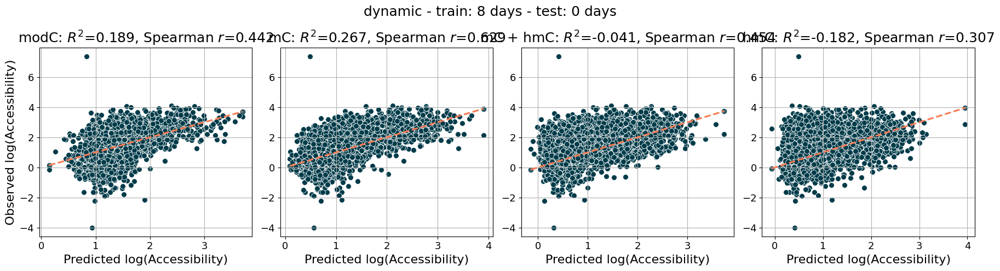

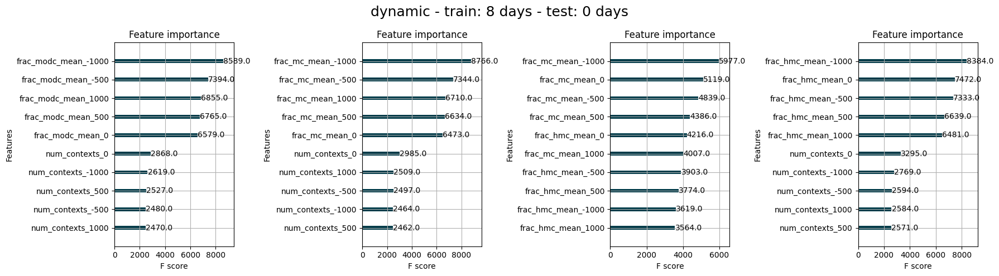

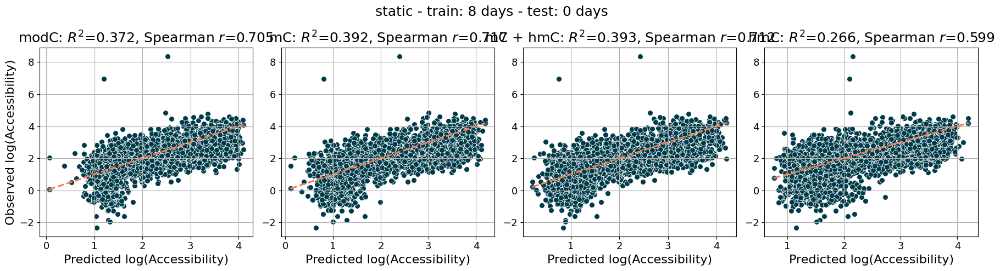

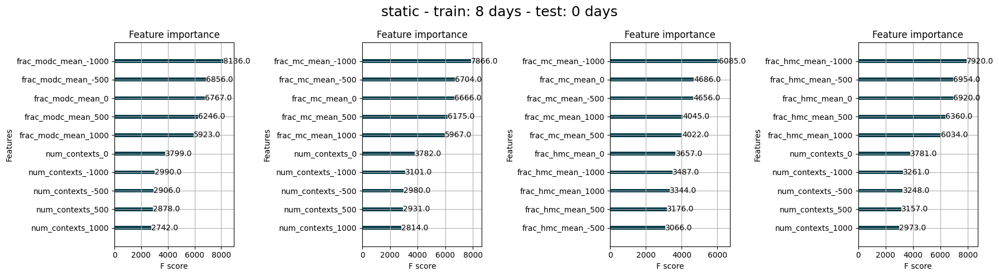

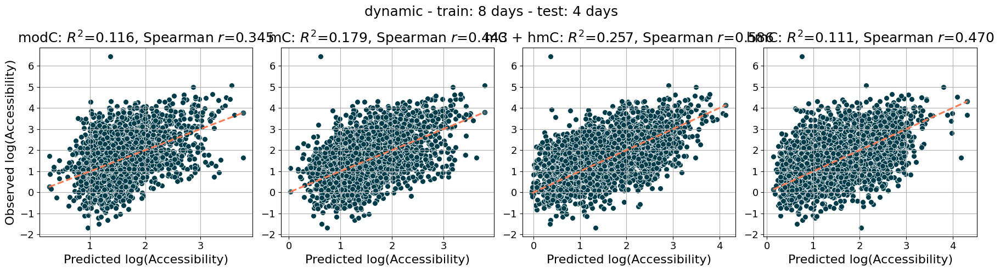

...

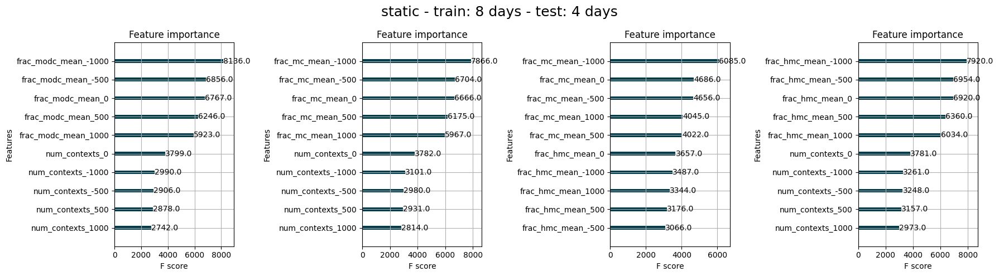

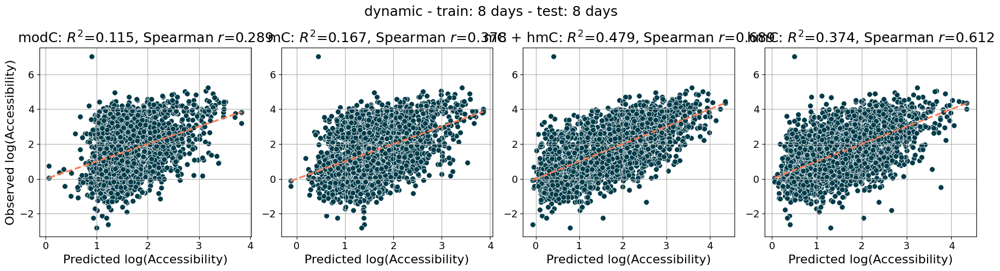

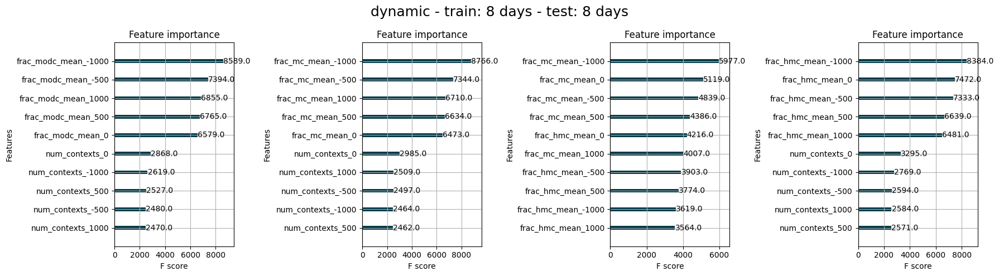

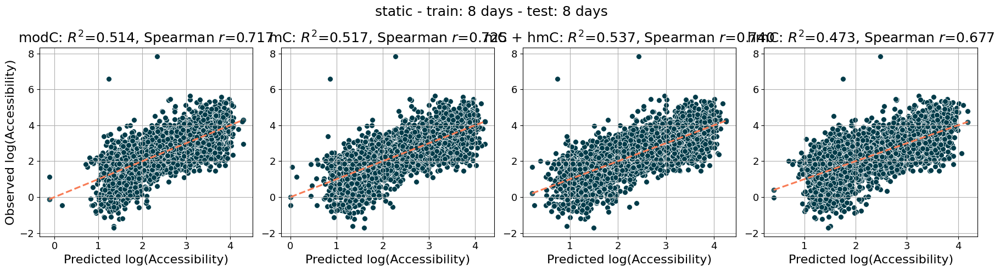

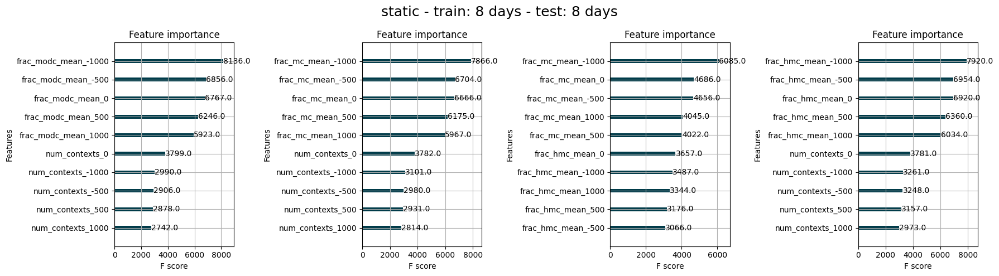

In [14]:
# 8 - predict 0
print("\n\nPredict - 0 hr")
for i in sets:
    print(i)
    predict_accessibility_from_timepoint_scatter(res_train = beds250_m8[i], res_test=beds250_m0[i], t1=8, t2=0, set_name=i, main_title = i+" - train: 8 days - test: 0 days", graphs=True)

# 8 - predict 4
print("\n\nPredict - 4 days")
for i in sets:
    print(i)
    predict_accessibility_from_timepoint_scatter(res_train = beds250_m8[i], res_test=beds250_m4[i], t1=8, t2=4, set_name=i, main_title = i+" - train: 8 days - test: 4 days", graphs=True)

# 8 - predict 8
print("\n\nPredict - 8 days")
for i in sets:
    print(i)
    predict_accessibility_from_timepoint_scatter(res_train = beds250_m8[i], res_test=beds250_m8[i], t1=8, t2=8, set_name=i, main_title = i+" - train: 8 days - test: 8 days", graphs=True)

# Spearman values - format and save

In [30]:
sets

['dynamic', 'static']

In [15]:
## second time - 0 and 4 didn't save scatterplots?
spears

{'mc_00': ['0.7088', '0.7523'],
 'mchmc_00': ['0.7122', '0.7595'],
 'hmc_00': ['0.3867', '0.622'],
 'mc_04': ['0.408', '0.7497'],
 'mchmc_04': ['0.3998', '0.7475'],
 'hmc_04': ['0.2621', '0.6587'],
 'mc_08': ['0.3301', '0.7089'],
 'mchmc_08': ['0.3287', '0.7072'],
 'hmc_08': ['0.3853', '0.6515'],
 'mc_40': ['0.6546', '0.733'],
 'mchmc_40': ['0.6008', '0.7361'],
 'hmc_40': ['0.28', '0.6145'],
 'mc_44': ['0.4799', '0.7698'],
 'mchmc_44': ['0.6359', '0.7749'],
 'hmc_44': ['0.487', '0.7052'],
 'mc_48': ['0.3687', '0.721'],
 'mchmc_48': ['0.64', '0.7281'],
 'hmc_48': ['0.583', '0.6748'],
 'mc_80': ['0.6292', '0.7174'],
 'mchmc_80': ['0.4537', '0.7121'],
 'hmc_80': ['0.3074', '0.5995'],
 'mc_84': ['0.4433', '0.7588'],
 'mchmc_84': ['0.5856', '0.7525'],
 'hmc_84': ['0.4699', '0.6779'],
 'mc_88': ['0.3783', '0.7253'],
 'mchmc_88': ['0.6888', '0.7404'],
 'hmc_88': ['0.6115', '0.677']}

In [33]:
spears

{'mc_00': ['0.7088', '0.7523'],
 'mchmc_00': ['0.7122', '0.7595'],
 'hmc_00': ['0.3867', '0.622'],
 'mc_04': ['0.408', '0.7497'],
 'mchmc_04': ['0.3998', '0.7475'],
 'hmc_04': ['0.2621', '0.6587'],
 'mc_08': ['0.3301', '0.7089'],
 'mchmc_08': ['0.3287', '0.7072'],
 'hmc_08': ['0.3853', '0.6515'],
 'mc_40': ['0.6546', '0.733'],
 'mchmc_40': ['0.6008', '0.7361'],
 'hmc_40': ['0.28', '0.6145'],
 'mc_44': ['0.4799', '0.7698'],
 'mchmc_44': ['0.6359', '0.7749'],
 'hmc_44': ['0.487', '0.7052'],
 'mc_48': ['0.3687', '0.721'],
 'mchmc_48': ['0.64', '0.7281'],
 'hmc_48': ['0.583', '0.6748'],
 'mc_80': ['0.6292', '0.7174'],
 'mchmc_80': ['0.4537', '0.7121'],
 'hmc_80': ['0.3074', '0.5995'],
 'mc_84': ['0.4433', '0.7588'],
 'mchmc_84': ['0.5856', '0.7525'],
 'hmc_84': ['0.4699', '0.6779'],
 'mc_88': ['0.3783', '0.7253'],
 'mchmc_88': ['0.6888', '0.7404'],
 'hmc_88': ['0.6115', '0.677']}

In [34]:
np.save('/data/hodges_lab/Tim/biomodal/spears.prediction_dynamic_vs_static.38000regions.90_10_split.optimized.npy', spears) 

## Melt

In [23]:
sets

['dynamic', 'static']

### put together

In [35]:
# column of methylation categories (meth data for model training)
meth_list=(['mc','mchmc','hmc']*9)*2

In [37]:
# column of training times (000000000444444444888888888 per group in sets)
train_time=((['0']*9)+(['4']*9)+(['8']*9))*2

In [38]:
# column of testing times (000444888000444888000444888 per group in sets)
test_time=(((['0']*3)+(['4']*3)+(['8']*3)) * 3) * 2

In [39]:
# 27 repetitions per set
labs=(['dynamic']*27)+(['static']*27)

In [40]:
# combine into a Pandas dataframe for export to R for tidyverse
# note: long format to be tidyverse-friendly
spears_to_save=pd.DataFrame({
    'meth': meth_list,
    'train_time': train_time,
    'test_time': test_time,
    'set': labs,
    'spearman': pd.DataFrame.from_dict(spears, orient='index').melt().value
})

In [41]:
spears_to_save

,meth,train_time,test_time,set,spearman
0,mc,0,0,dynamic,0.7088
1,mchmc,0,0,dynamic,0.7122
2,hmc,0,0,dynamic,0.3867
3,mc,0,4,dynamic,0.408
4,mchmc,0,4,dynamic,0.3998
5,hmc,0,4,dynamic,0.2621
6,mc,0,8,dynamic,0.3301
7,mchmc,0,8,dynamic,0.3287
8,hmc,0,8,dynamic,0.3853
9,mc,4,0,dynamic,0.6546


### save

In [43]:
spears_to_save.to_csv('/data/hodges_lab/Tim/biomodal/data/spears.prediction_dynamic_vs_static.38000regions.long_form_melted.optimized.txt', sep="\t", index = None)

# R plot - [Fig6B]

## Libraries

In [1]:
library(ggplot2)
library(tidyverse)
library(RColorBrewer)
library(ggrepel)
library(data.table)

── Attaching packages ─────────────────────────────────────── tidyverse 1.3.1 ──

✔ tibble  3.2.1     ✔ dplyr   1.1.1
✔ tidyr   1.3.0     ✔ stringr 1.5.0
✔ readr   2.1.2     ✔ forcats 0.5.1
✔ purrr   1.0.1     

── Conflicts ────────────────────────────────────────── tidyverse_conflicts() ──
✖ dplyr::filter() masks stats::filter()
✖ dplyr::lag()    masks stats::lag()


Attaching package: ‘data.table’


The following objects are masked from ‘package:dplyr’:

    between, first, last


The following object is masked from ‘package:purrr’:

    transpose




## Load data

In [2]:
sdf <- read_tsv("/data/hodges_lab/Tim/biomodal/data/spears.prediction_dynamic_vs_static.38000regions.long_form_melted.txt", col_names=T)
# Replace "sets" with "static"
sdf <- sdf %>% mutate(across('set', str_replace, 'sets', 'static'))
sdf

Rows: 54 Columns: 5
── Column specification ────────────────────────────────────────────────────────
Delimiter: "\t"
chr (2): meth, set
dbl (3): train_time, test_time, spearman

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
Warning message:
“There was 1 warning in `mutate()`.
ℹ In argument: `across("set", str_replace, "sets", "static")`.
Caused by warning:
! The `...` argument of `across()` is deprecated as of dplyr 1.1.0.
Supply arguments directly to `.fns` through an anonymous function instead.

  # Previously
  across(a:b, mean, na.rm = TRUE)

  # Now
  across(a:b, \(x) mean(x, na.rm = TRUE))”


meth,train_time,test_time,set,spearman
<chr>,<dbl>,<dbl>,<chr>,<dbl>
mc,0,0,dynamic,0.7100
mchmc,0,0,dynamic,0.7133
hmc,0,0,dynamic,0.3886
mc,0,4,dynamic,0.4097
mchmc,0,4,dynamic,0.3980
hmc,0,4,dynamic,0.2886
mc,0,8,dynamic,0.3335
mchmc,0,8,dynamic,0.3263
hmc,0,8,dynamic,0.4114


## Plot

### targeted

In [35]:
meth_list=rep(c("mc", "hmc","mchmc"), 3)
trnt_list=c(rep("0", 3), rep("4", 3), rep("8", 3))
tstt_list=trnt_list
methtraintest_order=paste0(meth_list, "_", trnt_list) #, tstt_list)
methtraintest_order

[1] "mc_0"    "hmc_0"   "mchmc_0" "mc_4"    "hmc_4"   "mchmc_4" "mc_8"   
[8] "hmc_8"   "mchmc_8"

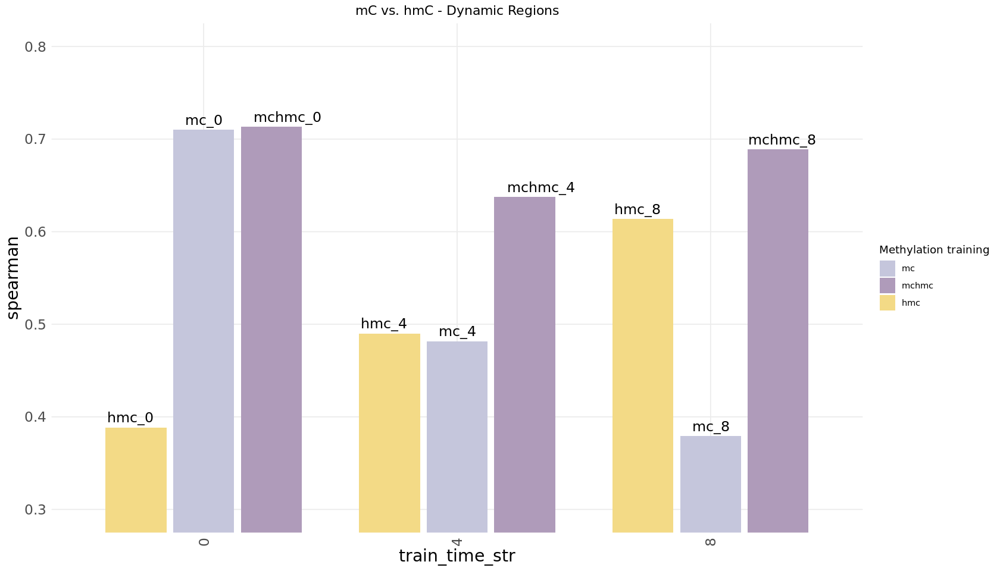

In [46]:
# font size 
lab_size=14
axislab_size=17
label_size=5
fig_h=8
fig_w=14

# plot size
options(repr.plot.width = fig_w, repr.plot.height = fig_h)

# colors
# col_dict = c(
#     "mc"="cadetblue1",
#     "mchmc"="lightsalmon3",
#     "hmc"="salmon1"
# )

col_dict = c(
    "mc"="#C5C6DC",
    "mchmc"="#AF9BBA",
    "hmc"="#F3DA86"
)

p <- sdf %>%
    filter(set=="dynamic") %>% # Filter dynamic
    filter(train_time==test_time) %>% # Filter 0-0, 4-4, 8-8, result: 9 rows
    mutate(train_time_str=case_when(
            train_time==0 ~ "0",
            train_time==4 ~ "4",
            train_time==8 ~ "8"
        )) %>% # Set to string so x-axis doesn't try to apply a numerical tick system
    # This was for ordering all in a row - but wanted white space in between groups
    mutate(methtraintest_unordered=paste0(meth, "_", test_time)) %>% # make a var for x-axis
    mutate(methtraintest=factor(methtraintest_unordered, levels=methtraintest_order)) %>% # order it;2-liner
    ggplot(aes(x = train_time_str, y=  spearman)) + # ggplot object
        geom_bar(aes(fill = meth), stat = "identity", # fill by meth
                 position = position_dodge2(), 
                 width = 0.8) + 
    scale_fill_manual("Methylation training", values = col_dict ) + # set colors for meth
    theme_minimal() +
    ggtitle("mC vs. hmC - Dynamic Regions") + 
    theme(
            #aspect.ratio = 1,
            plot.title = element_text(hjust = 0.5),
            strip.text.y = element_text(size = 16, hjust = 0, angle = 0),
            axis.title.x = element_text(size = axislab_size),
            axis.title.y = element_text(size = axislab_size),
            axis.text.y = element_text(size = lab_size),
            axis.text.x = element_text(angle = 90, vjust = 0.5, hjust=1, size = lab_size),
            #panel.grid.major = element_blank(),
            panel.grid.minor = element_blank()
    ) + 
    geom_text_repel(aes(label = methtraintest, group = meth), # actually, we use methtraintest as a quick label to delete later
                    hjust = -.25, vjust = 0, angle = 0,
                    position=position_dodge(width = .9), # dodge with the bars
                    size=label_size) +
    coord_cartesian(ylim = c(0.3, 0.8))
p

# save
ggsave(filename = paste0("/data/hodges_lab/Tim/biomodal/dynamic.mc_hmc_mchmc.optimized.pdf"), p, width = fig_w, height = fig_h, dpi = 150)

### 3x3

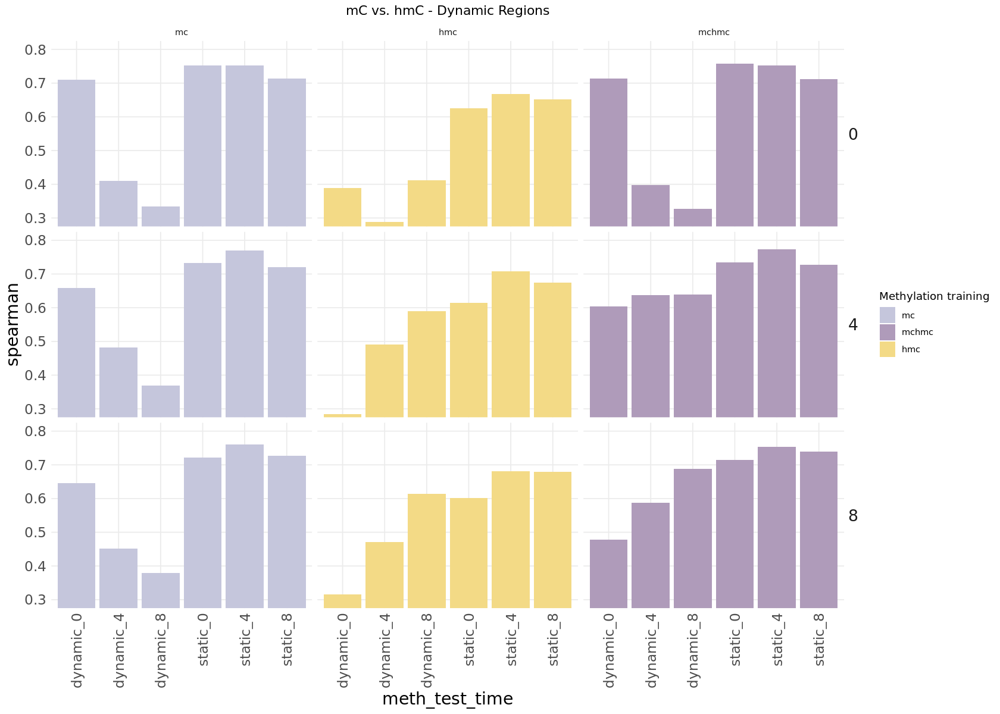

In [33]:
# font size 
lab_size=14
axislab_size=17
label_size=5
fig_h=10
fig_w=14

# plot size
options(repr.plot.width = fig_w, repr.plot.height = fig_h)

# colors
col_dict = c(
    "mc"="#C5C6DC",
    "mchmc"="#AF9BBA",
    "hmc"="#F3DA86"
)

meth_test_time_order <- c('dynamic_0', 'dynamic_4', 'dynamic_8', 'static_0', 'static_4', 'static_8')

p <- sdf %>%
    # For ordering x-axis in a way where it avoids a continuous numerical x-axis
    mutate(test_time_str=case_when(
            test_time==0 ~ "0",
            test_time==4 ~ "4",
            test_time==8 ~ "8"
        )) %>%
    mutate(meth_test_time=paste0(set, "_", test_time_str)) %>% # for x-axis labels
    mutate(meth=factor(meth, levels=c('mc','hmc','mchmc'))) %>% # order meth levels in faceting
    mutate(meth_test_time=factor(meth_test_time, levels=meth_test_time_order)) %>%

    ggplot(aes(x = meth_test_time, y = spearman)) + # ggplot object
        geom_bar(aes(fill = meth), # fill by meth
                 stat = "identity", 
                 position = position_dodge2()) + 
        scale_fill_manual("Methylation training", values = col_dict ) + # set colors for meth
        theme_minimal() + # cleaner theme
        ggtitle("mC vs. hmC - Dynamic Regions") + 
        theme(
                #aspect.ratio = 1,
                plot.title = element_text(hjust = 0.5), # center title
                strip.text.y = element_text(size = 16, hjust = 0, angle = 0), # facet label cols
                axis.title.x = element_text(size = axislab_size), # axis label size
                axis.title.y = element_text(size = axislab_size), # axis label size
                axis.text.y = element_text(size = lab_size), # axis text size
                axis.text.x = element_text(angle = 90, vjust = 0.5, hjust=1, size = lab_size), # x-ax text
                panel.grid.minor = element_blank() # numerical labels at intervals of 0.1, removed minor only
        ) + 
        coord_cartesian(ylim = c(0.3, 0.8)) + # compress y-axis 
        facet_grid(train_time ~ meth) # facet into 3x3 grid
p

# save
ggsave(filename = paste0("/data/hodges_lab/Tim/biomodal/dynamic_vs_static.mc_hmc_mchmc.3x3.optimized.pdf"), p, width = fig_w, height = fig_h, dpi = 150)

# R version check 

In [2]:
R.version

               _                           
platform       x86_64-conda-linux-gnu      
arch           x86_64                      
os             linux-gnu                   
system         x86_64, linux-gnu           
status                                     
major          4                           
minor          1.2                         
year           2021                        
month          11                          
day            01                          
svn rev        81115                       
language       R                           
version.string R version 4.1.2 (2021-11-01)
nickname       Bird Hippie                 

In [3]:
packageVersion("ggplot2")

[1] ‘3.3.6’